In [1]:
import os, pickle, sys, copy
sys.path.insert(0, os.path.join(os.getcwd()))

import numpy as np
import matplotlib as mpl
from matplotlib import rc
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates

from exp_utils import PATHClass, make_clients, select_group, round_data, put_position, smoothing, bool_to_txt, cold_start_display, cold_start_display_per, display_output,get_selection
from experiment_parameter import *
from model_parameter import *

# Matplotlib params

In [2]:
# Set the global font to be DejaVu Sans, size 10 (or any other sans-serif font of your choice!)
#rc('font',**{'family':'sherif','sans-serif':['Verdana'],'size':11})

# Set the font used for MathJax - more on this later
#rc('mathtext',**{'default':'regular'})
#plt.style.use('fivethirtyeight')

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Computer Modern"
plt.rcParams["text.usetex"] = True
plt.style.use('ggplot')
x_size = 6 
y_size = 4
plt.rcParams["figure.figsize"] = (x_size,y_size)
plt.rcParams["lines.linewidth"] = 1
plt.rcParams["savefig.dpi"] = 1024

plt.rcParams["figure.subplot.bottom"] = 0.1
plt.rcParams["figure.subplot.top"] = 0.8
plt.rcParams["figure.subplot.left"] = 0.1
plt.rcParams["figure.subplot.right"] = 0.9
plt.rcParams["figure.subplot.hspace"] = 0.02
plt.rcParams["figure.subplot.wspace"] = 0.1

plt.rcParams["figure.titlesize"] = 20
plt.rcParams["figure.titleweight"] = "normal"

plt.rcParams["font.size"] = 14
plt.rcParams["font.weight"] = "normal"

plt.rcParams["xtick.labelsize"] = 16
plt.rcParams["ytick.labelsize"] = 16

plt.rcParams["legend.fontsize"] = 12
#list(colormaps)
colormap = mpl.cm.Dark2
colormap = plt.cm.colors.ListedColormap(['black', 'blue', "purple", 'red', "orange", 'yellow', 'green'])
color_list = colormap.colors
style_list=['-','--','-.',':']

kind = "linear"

# To make into latex : print(temp_res.to_latex(float_format="%.2f"))

# Experiment params and result loading

In [3]:
experiment_name = "Exp_1"
file_name = f"result data {experiment_name}"

# Dictionnary of conditions to select from the dataset. We focus on the MeanAbsoluteError.
condition = {}

In [4]:
# Loading the results 
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name
extension = ".pkl" 
df = pd.read_pickle(os.path.join(Path.EXP_PATH, file_name + extension))

#Loading the corresponding parameters    
with open(os.path.join(Path.EXP_PATH, f"{experiment_name}_exp_parameters.pkl"), "rb") as f:
    exp = pickle.load(f)

    
with open(os.path.join(Path.EXP_PATH, f"{experiment_name}_model_parameters.pkl"), "rb") as f:
    model = pickle.load(f)


# Global result

## Algorithm Global Results

Comparing on average (across all turbine, starting date, time range) the performances of local training, FedAvg for intra and cross-farm learning with and without fine-tuning. 

In [7]:
condition["algo"]  = ["Local", "FedAvg"]  # Choice of algorithms to compare 
temp_res = select_group(df = df, target=["res"], group_by=["algo", "finetuned", "cross_farm"], condition= condition)
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(0)
temp_res = temp_res.unstack(1)
temp_res = temp_res.dropna(axis = 1, how = "all").fillna(value = "NA")
    
ridx = list(map(lambda x: "With fine-tuning" if x else "Without fine-tuning",temp_res.index))
temp_res.index = pd.Index(ridx, name = "")
cidx = list(map(lambda x: (x[1], bool_to_txt(x[2])),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ["", ""])
temp_res


FedAvg            Local
                    Intra-farm Cross-farm    NA
                                               
Without fine-tuning       1.31       6.92    NA
With fine-tuning          0.87       0.97  1.44

## Global Time Range Influence

We first compare finetuned FedAvg in intra farm setting with Local result with their dependency across time range. 

In [8]:
temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], condition= {"algo": ["Local", "FedAvg"], "finetuned": True})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(0)
temp_res = temp_res.dropna(axis = 0, how = "all")
    
ridx = list(map(lambda x: (x[0], bool_to_txt(x[1])),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", ""])
cidx = list(map(lambda x: x[1],temp_res.columns))
temp_res.columns = pd.Index(cidx, name = '')
temp_res

7 days  14 days  21 days  28 days  35 days  42 days  \
                                                                         
FedAvg Intra-farm    1.53     1.08     0.92     0.87     0.84     0.82   
       Cross-farm    1.77     1.33     1.05     0.95     0.92     0.85   
Local  NA            3.12     2.07     1.65     1.43     1.34     1.25   

                   49 days  56 days  63 days  70 days  77 days  84 days  
                                                                         
FedAvg Intra-farm     0.85     0.79     0.73     0.74     0.71     0.62  
       Cross-farm     0.86     0.82     0.83     0.79     0.75     0.72  
Local  NA             1.18     1.14     1.10     1.09     1.04     0.97

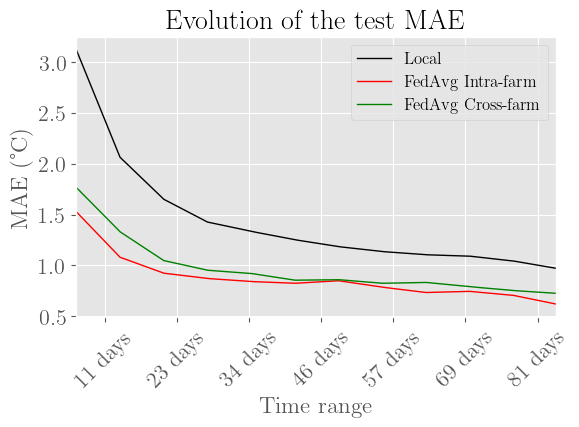

In [9]:
temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], condition= {'finetuned': True})
temp_res = temp_res.unstack(1, fill_value= np.nan)
temp_res = temp_res.unstack(1, fill_value= np.nan)
temp_res = temp_res.dropna(axis = 1, how = "all")

temp_res = put_position(temp_res, ("res", 'Local', 'NA')) 
temp_res = smoothing(temp_res, kind = kind)

X = temp_res.index
fig, ax = plt.subplots()
temp_res.plot(legend = True, ax = ax, cmap = colormap)

ticks_loc = ax.get_xticks().tolist()
ax.xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
ticks_label = ax.get_xticklabels()
l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
ax.set_xticklabels(l)
ax.xaxis.set_tick_params(rotation=45)
ax.set_xlabel('Time range')
ax.set_ylabel('MAE (°C)')
ax.set_title("Evolution of the test MAE")

ax.legend([f'{col[1]} {bool_to_txt(col[2], na = "")}' for col in temp_res.columns.unique()])

fig.savefig("../img/time_evolution.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

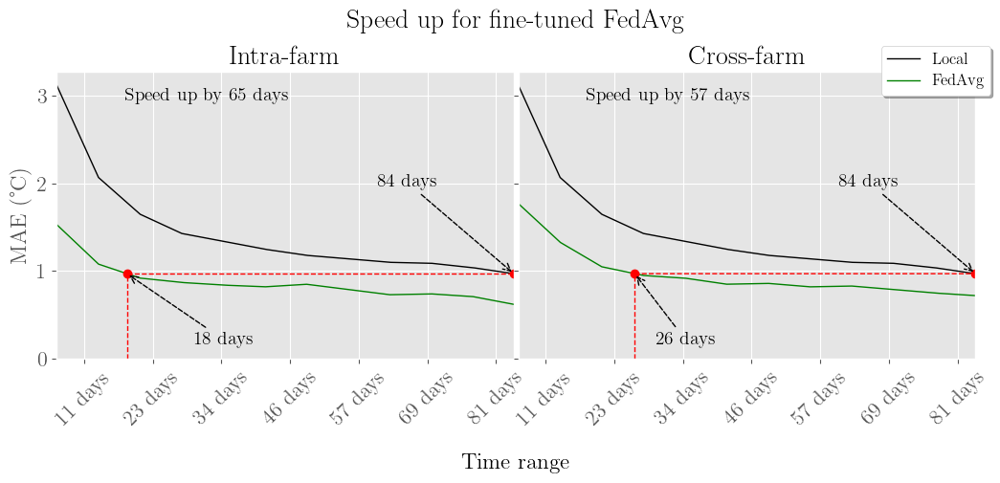

In [10]:

fig, axs = plt.subplots(1,2,  figsize=(2*x_size, 1.25*y_size), sharey = "row", sharex=True)
fig.subplots_adjust(bottom = 0.25, top = 0.85, hspace= 0.01, wspace= 0.01)

temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", 'cross_farm'], condition={'algo':["Local", "FedAvg"], "finetuned": True})
temp_res = temp_res.unstack(1, fill_value= np.nan)
temp_res = temp_res.unstack(1, fill_value= np.nan)
temp_res = smoothing(temp_res, kind = kind)
min = temp_res.min(axis=None)
max = temp_res.max(axis=None)


cold_start_display_per(df, "FedAvg", colormap, axs = axs[0], conditions = {"cross_farm": [False, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True},\
            title = "Intra-farm", inter_position = (0.3,0.05), text_position = (0.15, 0.9), fig = fig, relative = 'axes fraction', kind = kind, \
            tol_perc=0, loc_pos=(0.7, 0.6), loc_relative = 'axes fraction')

cold_start_display_per(df, "FedAvg", colormap, axs = axs[1], conditions = {"cross_farm": [True, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True},\
            title = "Cross-farm", inter_position = (0.3,0.05), text_position = (0.15, 0.9), fig = fig, relative = 'axes fraction', kind = kind,\
            tol_perc= 0, loc_pos=(0.7, 0.6), loc_relative = 'axes fraction')
axs[0].set_ylabel(f"MAE (°C)")
axs[0].get_legend().remove()
axs[1].get_legend().remove()
#axs[0].set_ylim(bottom=0, top = max*1.05)
#axs[1].set_ylim(bottom=0, top = max*1.05)
h, l = axs[1].get_legend_handles_labels()
plt.figlegend(h, ["Local", "FedAvg"], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.92, 0.92))
fig.suptitle(f"Speed up for fine-tuned FedAvg")

fig.savefig("../img/cold_start_speedup.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

## Seasonality Effect

In [11]:
temp_res = select_group(df = df, target=["res"], group_by=["start", "algo", "finetuned", "cross_farm"], condition= {})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(2)
temp_res = temp_res.dropna(axis = 0, how = "all")
temp_res = temp_res.dropna(axis = 1, how = "all")
temp_res = temp_res.fillna(value = "NA")

ridx = list(map(lambda x: (x[0], bool_to_txt(x[1], txt_true= "With fine-tuning", txt_false= "Without fine-tuning")),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", ""])
cidx = list(map(lambda x: (x[1], bool_to_txt(x[2])),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ['', ""])
temp_res

FedAvg            Local
                                        Intra-farm Cross-farm    NA
                                                                   
2016-12-01 18:30:00 Without fine-tuning       1.18       7.37    NA
                    With fine-tuning          0.75       0.91   1.3
2017-03-01 18:30:00 Without fine-tuning       1.13       6.91    NA
                    With fine-tuning          0.66       0.86  1.22
2017-06-01 18:30:00 Without fine-tuning       1.63       5.90    NA
                    With fine-tuning          1.22       1.04  1.68
2017-09-01 18:30:00 Without fine-tuning       1.31       7.50    NA
                    With fine-tuning          0.87       1.05  1.58

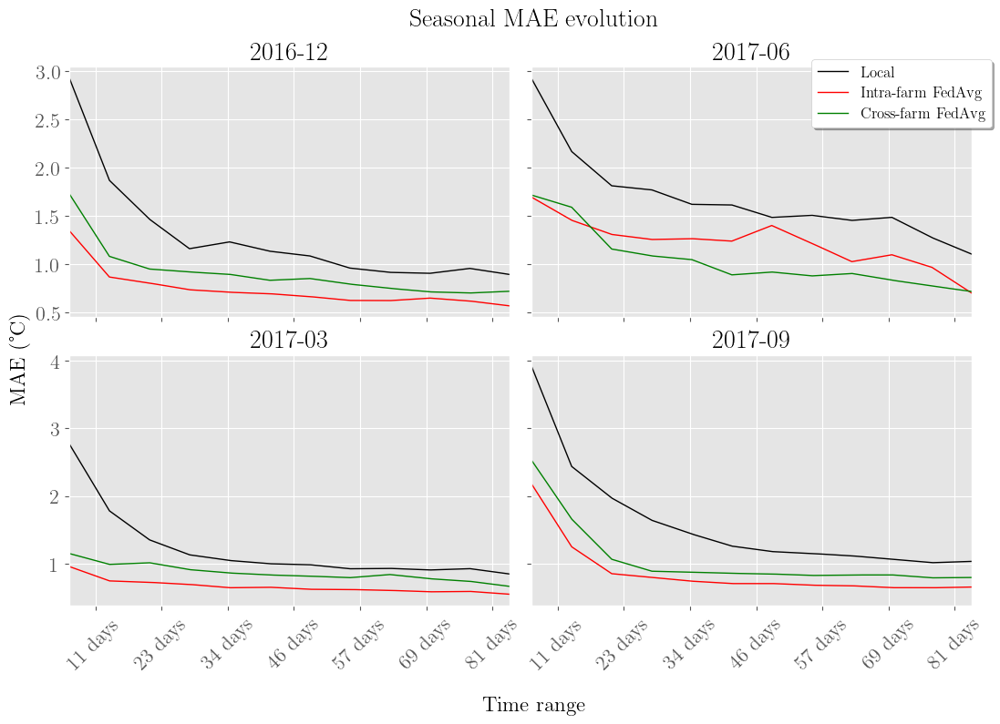

In [12]:
all_start = df["start"].unique()
fig, axs = plt.subplots(2,2, sharex= "col", sharey = "row", figsize = (2*x_size,2*y_size))
fig.subplots_adjust(hspace=0.15, top = 0.9, wspace=0.05, left = 0.075, bottom=0.16)
for n in range(4):
    i = n%2 
    j = n//2
    if n < len(all_start):
        start = all_start[n]
        temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], \
                                condition= {"finetuned": [True], "algo": ["Local", "FedAvg"], "start": all_start[n]})
        temp_res = temp_res.unstack(1)
        temp_res = temp_res.unstack(1)
        temp_res = temp_res.dropna(axis = 1, how = "all")
        temp_res = temp_res.dropna(axis = 0, how = "all")
        temp_res = put_position(temp_res, ("res", 'Local', "NA")) 
        temp_res = smoothing(temp_res, kind = kind)
        temp_res.plot(legend = False, ax = axs[i][j], cmap = colormap)
        axs[i][j].set_title("-".join(start.split("-")[:2]))
        
    axs[i][j].xaxis.set_tick_params(rotation=45)   
    ticks_loc = axs[i][j].get_xticks().tolist()
    axs[i][j].xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
    ticks_label = axs[i][j].get_xticklabels()
    l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
    axs[i][j].set_xticklabels(l)
    
    
    
    ax.set_ylim(bottom=0)
    txt = lambda col : "" if col[2] == "NA" else "Cross-farm " if col[2] else "Intra-farm "
    

h,l = axs[1][1].get_legend_handles_labels()
plt.figlegend(h,[f"{txt(col)}{col[1]}" for col in temp_res.columns.unique()], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.925, 0.92))
fig.suptitle("Seasonal MAE evolution")  
fig.supxlabel('Time range')
fig.supylabel('MAE (°C)')    

fig.savefig("../img/seasonality.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass 

# Farm Wise Study

## Initial Farm-Wise Results

In [13]:
temp_res = select_group(df = df, target=["res"], group_by=["algo", "farm", "finetuned", "cross_farm"], condition= {"algo": ["Local", "FedAvg"]})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(0)
temp_res = temp_res.unstack(2)
temp_res = temp_res.dropna(axis = 1, how = "all").fillna(value = "NA")

ridx = list(map(lambda x: (x[0], "With fine-tuning" if x[1] else "Without fine-tuning"),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", ""])
cidx = list(map(lambda x: (x[1], bool_to_txt(x[2])),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ["", ""])

temp_res


FedAvg            Local
                                Intra-farm Cross-farm    NA
                                                           
EDP         Without fine-tuning       1.74       2.33    NA
            With fine-tuning          1.35       1.44   2.1
Kelmarsh    Without fine-tuning       1.18       1.81    NA
            With fine-tuning          0.87       0.65  1.23
Penmanshiel Without fine-tuning       1.02      16.65    NA
            With fine-tuning          0.40       0.82   1.0

## Farm-wise Time Range Influence

We first compare finetuned FedAvg in intra farm setting with Local result with their dependency across time range. 

In [14]:
temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "farm", "algo", "cross_farm"], condition= {"algo": ["Local", "FedAvg"], "finetuned": True})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(0)

ridx = list(map(lambda x: (x[0], x[1], bool_to_txt(x[2])),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", "", ""])
cidx = list(map(lambda x: x[1],temp_res.columns))
temp_res.columns = pd.Index(cidx, name = '')
temp_res

7 days  14 days  21 days  28 days  35 days  \
                                                                            
EDP         FedAvg Intra-farm    2.31     1.65     1.50     1.38     1.27   
                   Cross-farm    2.67     1.95     1.55     1.45     1.31   
            Local  NA            5.83     3.32     2.53     1.92     1.79   
Kelmarsh    FedAvg Intra-farm    1.35     0.97     0.84     0.85     0.90   
                   Cross-farm    1.18     0.95     0.71     0.61     0.64   
            Local  NA            1.94     1.54     1.32     1.30     1.24   
Penmanshiel FedAvg Intra-farm    0.87     0.62     0.43     0.38     0.35   
                   Cross-farm    1.38     1.09     0.89     0.80     0.82   
            Local  NA            1.42     1.33     1.11     1.06     0.98   

                               42 days  49 days  56 days  63 days  70 days  \
                                                                             
EDP         FedAvg Intra-farm     1.26     1.23     1.16     1.19     1.16   
                   Cross-farm     1.24     1.25     1.19     1.25     1.17   
            Local  NA             1.56     1.50     1.41     1.35     1.37   
Kelmarsh    FedAvg Intra-farm     0.86     0.99     0.88     0.72     0.80   
                   Cross-farm     0.59     0.56     0.55     0.56     0.53   
            Local  NA             1.23     1.09     1.10     1.08     1.07   
Penmanshiel FedAvg Intra-farm     0.35     0.33     0.33     0.29     0.28   
                   Cross-farm     0.74     0.77     0.73     0.68     0.67   
            Local  NA             0.97     0.96     0.90     0.87     0.83   

                               77 days  84 days  
                                                 
EDP         FedAvg Intra-farm     1.12     1.03  
                   Cross-farm     1.13     1.06  
            Local  NA             1.35     1.26  
Kelmarsh    FedAvg Intra-farm     0.73     0.56  
                   Cross-farm     0.48     0.48  
            Local  NA             0.98     0.87  
Penmanshiel FedAvg Intra-farm     0.26     0.28  
                   Cross-farm     0.64     0.64  
            Local  NA             0.80     0.78

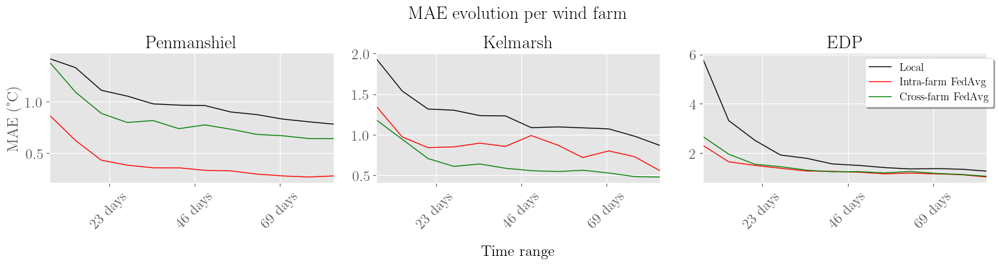

In [15]:
fig, axs = plt.subplots(1,3, sharey = False, figsize = (3*x_size, y_size))
fig.subplots_adjust(wspace = 0.15, bottom = 0.3)
for ax, farm in zip(axs, ["Penmanshiel", "Kelmarsh", "EDP"]):
    temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], condition= {'finetuned': True, "farm": farm})
    temp_res = temp_res.unstack(1, fill_value= np.nan)
    temp_res = temp_res.unstack(1, fill_value= np.nan)
    temp_res = temp_res.dropna(axis = 1, how = "all")

    temp_res = put_position(temp_res, ("res", 'Local', 'NA')) 
    temp_res = smoothing(temp_res, kind = kind)
    temp_res.plot(legend = False, ax = ax, cmap = colormap)

    ticks_loc = ax.get_yticks().tolist()
    ax.yaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
    ticks_label = ax.get_yticklabels()
    #l = [str(round(float(x.get_text()), 1)) for x in ticks_label]
    ax.set_yticklabels(ticks_label)

    ticks_loc = ax.get_xticks().tolist()
    ax.xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
    ticks_label = ax.get_xticklabels()
    l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
    ax.set_xticklabels(l)
    ax.xaxis.set_tick_params(rotation=45)
    
    ax.set_title(farm)

h,l = axs[0].get_legend_handles_labels()
plt.figlegend(h,[f"{txt(col)}{col[1]}" for col in temp_res.columns.unique()], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.8))
axs[0].set_ylabel("MAE (°C)")
fig.suptitle("MAE evolution per wind farm")
fig.supxlabel("Time range")


fig.savefig("../img/farm_time_evolution.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

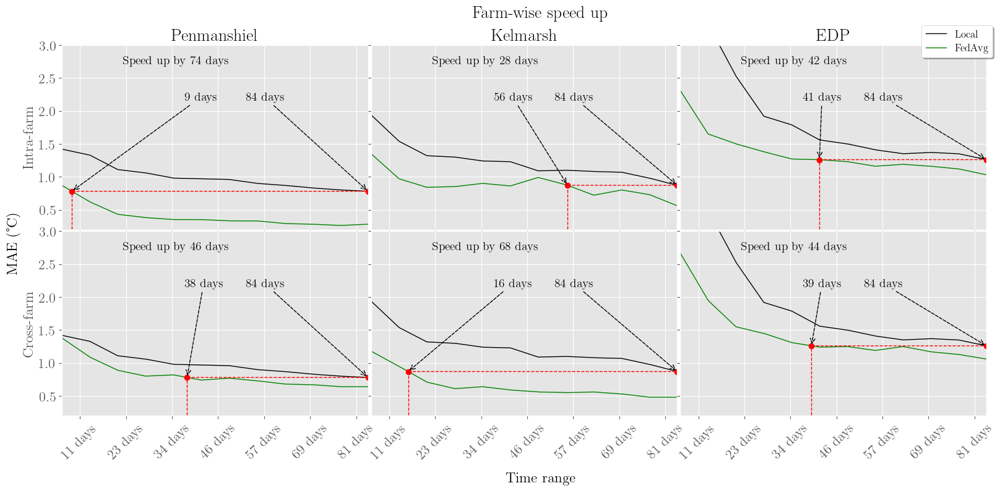

In [16]:

fig, axs = plt.subplots(2,3,  figsize=(3*x_size, 2*y_size), sharey = "row", sharex=True)
fig.subplots_adjust(bottom = 0.15, top = 0.9, hspace= 0.01, wspace= 0.01, left = 0.07)

for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", 'cross_farm'], condition={'algo':["Local", "FedAvg"], "finetuned": True, "farm": farm})
    temp_res = temp_res.unstack(1, fill_value= np.nan)
    temp_res = temp_res.unstack(1, fill_value= np.nan)
    temp_res = smoothing(temp_res, kind = kind)
    min = temp_res.min(axis=None)
    max = temp_res.max(axis=None)

    cold_start_display_per(df, "FedAvg", colormap, axs = axs[0][i], conditions = {"cross_farm": [False, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True, "farm": farm},\
                inter_position = (0.4,0.7), text_position = (0.2, 0.9), fig = fig, relative = 'axes fraction', kind = kind, tol_perc = 0,\
                    loc_pos=(0.6, 0.7), loc_relative = 'axes fraction')

    cold_start_display_per(df, "FedAvg", colormap, axs = axs[1][i], conditions = {"cross_farm": [True, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True, "farm": farm},\
                inter_position = (0.4,0.7), text_position = (0.2, 0.9), fig = fig, relative = 'axes fraction', kind = kind, tol_perc = 0,\
                loc_pos=(0.6, 0.7), loc_relative = 'axes fraction')
    axs[1][i].set_ylim(bottom=0.2, top = 3)
    axs[0][i].set_ylim(bottom=0.2, top = 3)
    axs[0][i].set_ylabel(f"{farm}")
    axs[0][i].set_title(f"{farm}")
    axs[1][i].set_title(f"")
h,l = axs[0][0].get_legend_handles_labels()
for i in range(2):
    for j in range(3):
        axs[i][j].get_legend().remove()
plt.figlegend(h, ["Local", "FedAvg"], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.95))

axs[0][0].set_ylabel(f"Intra-farm")
axs[1][0].set_ylabel(f"Cross-farm")
fig.supylabel("MAE (°C)")  
fig.supxlabel("Time range")  
fig.suptitle(f"Farm-wise speed up")

fig.savefig("../img/farm_cold_start_speedup.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

## Farm-wise seasonality effects

In [17]:
temp_res = select_group(df = df, target=["res"], group_by=["start","farm", "algo", "finetuned", "cross_farm"], condition= {})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(2)
temp_res = temp_res.dropna(axis = 0, how = "all")
temp_res = temp_res.dropna(axis = 1, how = "all")
temp_res = temp_res.fillna(value = "NA")

ridx = list(map(lambda x: (x[0], bool_to_txt(x[1], txt_true= "With fine-tuning", txt_false= "Without fine-tuning")),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", ""])
cidx = list(map(lambda x: (x[1],x[2], bool_to_txt(x[3])),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ['', "",""])
temp_res

EDP                   \
                                            FedAvg            Local   
                                        Intra-farm Cross-farm    NA   
                                                                      
2016-12-01 18:30:00 Without fine-tuning       1.79       2.49    NA   
                    With fine-tuning          1.48       1.53  2.24   
2017-03-01 18:30:00 Without fine-tuning       1.67       2.47    NA   
                    With fine-tuning          1.39       1.51  2.23   
2017-06-01 18:30:00 Without fine-tuning       1.77       2.02    NA   
                    With fine-tuning          1.30       1.32  1.88   
2017-09-01 18:30:00 Without fine-tuning       1.74       2.34    NA   
                    With fine-tuning          1.24       1.38  2.05   

                                          Kelmarsh                   \
                                            FedAvg            Local   
                                        Intra-farm Cross-farm    NA   
                                                                      
2016-12-01 18:30:00 Without fine-tuning       0.81       1.82    NA   
                    With fine-tuning          0.42       0.44  0.72   
2017-03-01 18:30:00 Without fine-tuning       0.78       1.93    NA   
                    With fine-tuning          0.35       0.40  0.59   
2017-06-01 18:30:00 Without fine-tuning       2.08       1.85    NA   
                    With fine-tuning          1.89       0.96  2.08   
2017-09-01 18:30:00 Without fine-tuning       1.06       1.63    NA   
                    With fine-tuning          0.83       0.80  1.53   

                                        Penmanshiel                   
                                             FedAvg            Local  
                                         Intra-farm Cross-farm    NA  
                                                                      
2016-12-01 18:30:00 Without fine-tuning        0.95      17.80    NA  
                    With fine-tuning           0.34       0.77  0.93  
2017-03-01 18:30:00 Without fine-tuning        0.94      16.32    NA  
                    With fine-tuning           0.25       0.68  0.83  
2017-06-01 18:30:00 Without fine-tuning        1.06      13.76    NA  
                    With fine-tuning           0.48       0.85  1.09  
2017-09-01 18:30:00 Without fine-tuning        1.12      18.76    NA  
                    With fine-tuning           0.52       0.97  1.16

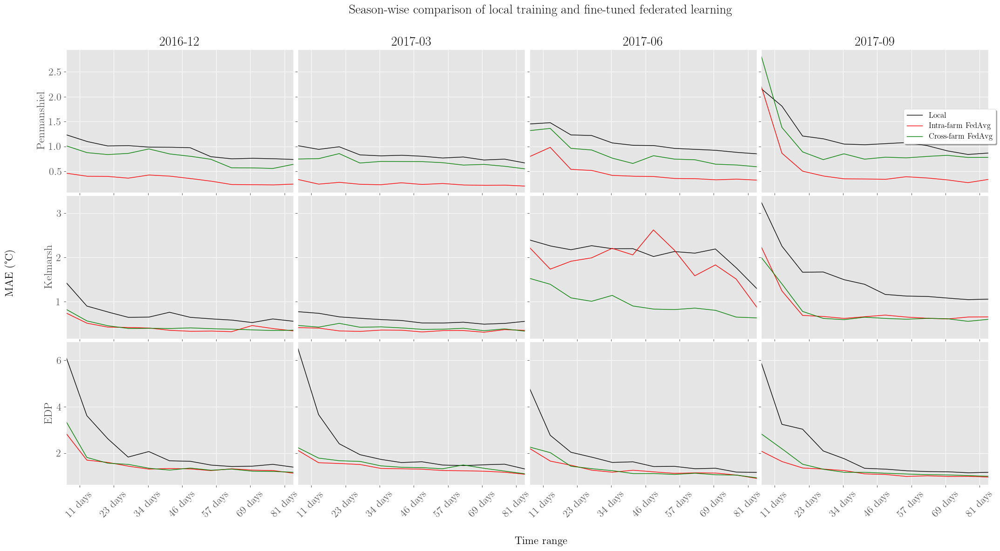

In [18]:
all_start = df["start"].unique()
fig, axs = plt.subplots(3,4, sharex= "col", sharey = "row", figsize = (4*x_size,3*y_size))
fig.subplots_adjust(top = 0.9, wspace = 0.02, bottom= 0.12, left = 0.075)

for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    
    for j in range(4):
        
        if j < len(all_start):
            start = all_start[j]
            temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], \
                                    condition= {"finetuned": [True], "algo": ["Local", "FedAvg"], "start": all_start[j], "farm": farm})
            temp_res = temp_res.unstack(1)
            temp_res = temp_res.unstack(1)
            temp_res = temp_res.dropna(axis = 1, how = "all")
            temp_res = temp_res.dropna(axis = 0, how = "all")
            temp_res = put_position(temp_res, ("res", 'Local', "NA")) 
            temp_res = smoothing(temp_res, kind = kind)
            temp_res.plot(legend = True, ax = axs[i][j], cmap = colormap)
            # axs[i][j].set_title(farm + " " + "-".join(start.split("-")[:2]))
            
            axs[0][j].set_title("-".join(start.split("-")[:2]))
            

        axs[i][j].xaxis.set_tick_params(rotation=45)   
        ticks_loc = axs[i][j].get_xticks().tolist()
        axs[i][j].xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
        ticks_label = axs[i][j].get_xticklabels()
        if len(all_start) == 4 or True: 
            l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
            axs[i][j].set_xticklabels(l)
        if i == 0 and j == 0:
            h,l = axs[0][0].get_legend_handles_labels()
        axs[i][j].set_ylabel(f'{farm}')
        txt = lambda col : "" if col[2] == "NA" else "Cross-farm " if col[2] else "Intra-farm "
        axs[i][j].get_legend().remove()
h,l = axs[0][0].get_legend_handles_labels()
plt.figlegend(h,[f"{txt(col)}{col[1]}" for col in temp_res.columns.unique()], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.8))
fig.supylabel("MAE (°C)")
fig.suptitle("Season-wise comparison of local training and fine-tuned federated learning")
fig.supxlabel("Time range")  


fig.savefig("../img/farm_seasonality.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

# Individual turbines

In [19]:
temp_res = select_group(df = df, target=["res"], group_by=["farm", "client", "algo", "cross_farm", "finetuned" ], condition= {})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(2)
temp_res = temp_res.unstack(2)
temp_res = temp_res.unstack(2)
temp_res.dropna(axis = 1, inplace=True, how = "all")
temp_res.dropna(axis = 0, inplace=True, how = "all")    
    
ridx = list(map(lambda x: (x[0], " ".join(x[1].split("_")[-2:])),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, name = ["", ""])
cidx = list(map(lambda x: (x[1], bool_to_txt(x[2]), "fine-tuning" if x[3] else "no fine-tuning"),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ["", "", ""])

temp_res

FedAvg                                         \
                      Intra-farm                 Cross-farm               
                  no fine-tuning fine-tuning no fine-tuning fine-tuning   
                                                                          
EDP         WT 01           1.38        1.30           2.23        1.39   
            WT 06           1.65        1.27           2.74        1.37   
            WT 07           1.41        1.26           2.39        1.31   
            WT 11           2.53        1.59           1.96        1.67   
Kelmarsh    WT 03           1.16        0.85           2.42        0.60   
            WT 04           1.12        0.83           1.27        0.63   
            WT 05           1.35        1.03           1.93        0.65   
            WT 06           1.09        0.76           1.60        0.72   
Penmanshiel WT 11           1.07        0.26          13.57        0.64   
            WT 12           0.83        0.43          14.87        0.80   
            WT 13           0.47        0.29          16.80        0.73   
            WT 14           1.70        0.61          21.36        1.10   

                        Local  
                           NA  
                  fine-tuning  
                               
EDP         WT 01        1.90  
            WT 06        2.21  
            WT 07        1.90  
            WT 11        2.39  
Kelmarsh    WT 03        1.09  
            WT 04        1.09  
            WT 05        1.39  
            WT 06        1.32  
Penmanshiel WT 11        0.89  
            WT 12        0.96  
            WT 13        0.83  
            WT 14        1.31

In [21]:
temp_res = select_group(df = df, target=["res"], group_by=["farm", "client", "algo", "cross_farm", "time_diff"], condition= {"finetuned": True, "algo" : ["FedAvg", "Local"]})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(4)
temp_res.dropna(axis = 1, inplace=True, how = "all")
temp_res.dropna(axis = 0, inplace=True, how = "all")
temp_res = temp_res.fillna(value = "NA")

    
ridx = list(map(lambda x: (x[0], "-".join(x[1].split("_")[1:]), x[2], bool_to_txt(x[3])),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, names = ["", "", "", ""])
cidx = list(map(lambda x: ("Number of weeks",x[1].days//7),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ["", ""])

temp_res


Number of weeks                          \
                                                 1     2     3     4     5    
                                                                              
EDP         WT-01 FedAvg Intra-farm            2.04  1.49  1.42  1.42  1.30   
                         Cross-farm            2.31  1.94  1.52  1.44  1.36   
                  Local  NA                    4.36  2.55  2.26  2.05  1.86   
            WT-06 FedAvg Intra-farm            2.63  1.61  1.36  1.22  1.09   
                         Cross-farm            3.14  1.98  1.46  1.28  1.16   
                  Local  NA                    8.22  4.01  2.29  1.83  1.36   
            WT-07 FedAvg Intra-farm            2.27  1.56  1.59  1.22  1.18   
                         Cross-farm            2.36  1.88  1.58  1.35  1.18   
                  Local  NA                    4.61  3.49  2.58  1.75  1.67   
            WT-11 FedAvg Intra-farm            2.32  1.92  1.64  1.68  1.52   
                         Cross-farm            2.88  2.02  1.65  1.72  1.54   
                  Local  NA                    6.14  3.24  2.98  2.06  2.28   
Kelmarsh    WT-03 FedAvg Intra-farm            1.31  0.88  0.71  0.85  0.91   
                         Cross-farm            0.96  0.81  0.62  0.55  0.78   
                  Local  NA                    1.84  1.32  1.01  1.10  0.97   
            WT-04 FedAvg Intra-farm            0.84  1.10  0.79  0.82  0.92   
                         Cross-farm            0.80  1.21  0.73  0.67  0.60   
                  Local  NA                    1.31  1.62  1.20  1.07  1.08   
            WT-05 FedAvg Intra-farm            1.78  0.96  1.17  1.03  1.14   
                         Cross-farm            1.58  0.73  0.70  0.58  0.58   
                  Local  NA                    2.64  1.60  1.63  1.46  1.42   
            WT-06 FedAvg Intra-farm            1.35  0.95  0.69  0.70  0.62   
                         Cross-farm            1.29  1.04  0.78  0.65  0.60   
                  Local  NA                    1.79  1.61  1.42  1.57  1.47   
Penmanshiel WT-11 FedAvg Intra-farm            0.61  0.44  0.26  0.21  0.21   
                         Cross-farm            0.92  0.85  0.73  0.63  0.63   
                  Local  NA                    1.29  1.25  0.99  0.94  0.87   
            WT-12 FedAvg Intra-farm            0.86  0.57  0.46  0.43  0.36   
                         Cross-farm            1.66  1.00  0.84  0.71  0.75   
                  Local  NA                    1.48  1.29  1.03  1.01  0.90   
            WT-13 FedAvg Intra-farm            0.46  0.57  0.37  0.29  0.26   
                         Cross-farm            1.16  1.13  0.84  0.77  0.75   
                  Local  NA                    1.05  1.18  0.94  0.89  0.85   
            WT-14 FedAvg Intra-farm            1.44  0.91  0.63  0.59  0.59   
                         Cross-farm            1.75  1.40  1.13  1.07  1.14   
                  Local  NA                    1.76  1.62  1.48  1.39  1.29   

                                                                               
                                       6     7     8     9     10    11    12  
                                                                               
EDP         WT-01 FedAvg Intra-farm  1.29  1.17  1.08  1.16  1.13  1.05  1.01  
                         Cross-farm  1.26  1.23  1.16  1.16  1.11  1.10  1.06  
                  Local  NA          1.64  1.48  1.46  1.29  1.30  1.25  1.31  
            WT-06 FedAvg Intra-farm  1.12  1.09  1.05  1.06  1.02  1.04  0.98  
                         Cross-farm  1.08  1.10  1.05  1.07  1.07  1.07  1.00  
                  Local  NA          1.31  1.26  1.23  1.28  1.30  1.25  1.19  
            WT-07 FedAvg Intra-farm  1.08  1.07  1.05  1.06  1.01  1.03  0.99  
                         Cross-farm  1.13  1.09  1.05  1.10  1.03  1.00  1.01  
                  Local  NA          1.30  1.39  1.23  1.23  1.20  1.19  1

In [22]:
temp_res = select_group(df = df, target=["res"], group_by=["farm", "client", "algo", "start", "cross_farm"], condition= {"algo": ["Local", "FedAvg"], "finetuned": True})
temp_res = round_data(temp_res)
temp_res = temp_res.unstack(3)
temp_res = temp_res.unstack(2)
temp_res = temp_res.unstack(2)
temp_res.dropna(axis=1, inplace=True, how = "all")
temp_res = temp_res.fillna(value = "NA")
   
ridx = list(map(lambda x: (x[0], "-".join(x[1].split("_")[1:])),temp_res.index))
temp_res.index = pd.MultiIndex.from_tuples(ridx, names = ["", ""])
cidx = list(map(lambda x: (x[1].split(" ")[0], x[2], bool_to_txt(x[3])),temp_res.columns))
temp_res.columns = pd.MultiIndex.from_tuples(cidx, names = ["", "", ""])
temp_res

2016-12-01                  2017-03-01                   \
                      FedAvg            Local     FedAvg            Local   
                  Intra-farm Cross-farm    NA Intra-farm Cross-farm    NA   
                                                                            
EDP         WT-01       1.53       1.61  1.96       1.13       1.24  1.78   
            WT-06       1.49       1.58  2.24       1.25       1.34  2.45   
            WT-07       1.18       1.19  2.06       1.39       1.47  1.83   
            WT-11       1.73       1.76  2.69       1.80       1.97  2.87   
Kelmarsh    WT-03       0.35       0.38  0.65       0.31       0.38  0.53   
            WT-04       0.34       0.41  0.63       0.33       0.41  0.57   
            WT-05       0.54       0.50  0.90       0.31       0.35  0.58   
            WT-06       0.44       0.47  0.71       0.46       0.48  0.68   
Penmanshiel WT-11       0.20       0.63  0.81       0.21       0.58  0.76   
            WT-12       0.24       0.63  0.71       0.27       0.65  0.76   
            WT-13       0.21       0.61  0.74       0.19       0.61  0.72   
            WT-14       0.69       1.21  1.44       0.31       0.89  1.06   

                  2017-06-01                  2017-09-01                   
                      FedAvg            Local     FedAvg            Local  
                  Intra-farm Cross-farm    NA Intra-farm Cross-farm    NA  
                                                                           
EDP         WT-01       1.38       1.41  1.95       1.14       1.29  1.92  
            WT-06       1.20       1.28  1.89       1.14       1.28  2.26  
            WT-07       1.09       1.08  1.52       1.37       1.51  2.18  
            WT-11       1.54       1.50  2.16       1.29       1.46  1.87  
Kelmarsh    WT-03       2.08       1.00  2.12       0.66       0.64  1.06  
            WT-04       2.24       1.20  2.38       0.51       0.56  0.90  
            WT-05       2.72       1.10  3.09       0.56       0.65  1.01  
            WT-06       0.54       0.55  0.75       1.61       1.36  3.15  
Penmanshiel WT-11       0.32       0.66  1.02       0.30       0.69  0.95  
            WT-12       0.53       0.75  1.02       0.68       1.15  1.35  
            WT-13       0.42       0.93  0.93       0.33       0.76  0.95  
            WT-14       0.65       1.04  1.38       0.78       1.27  1.37

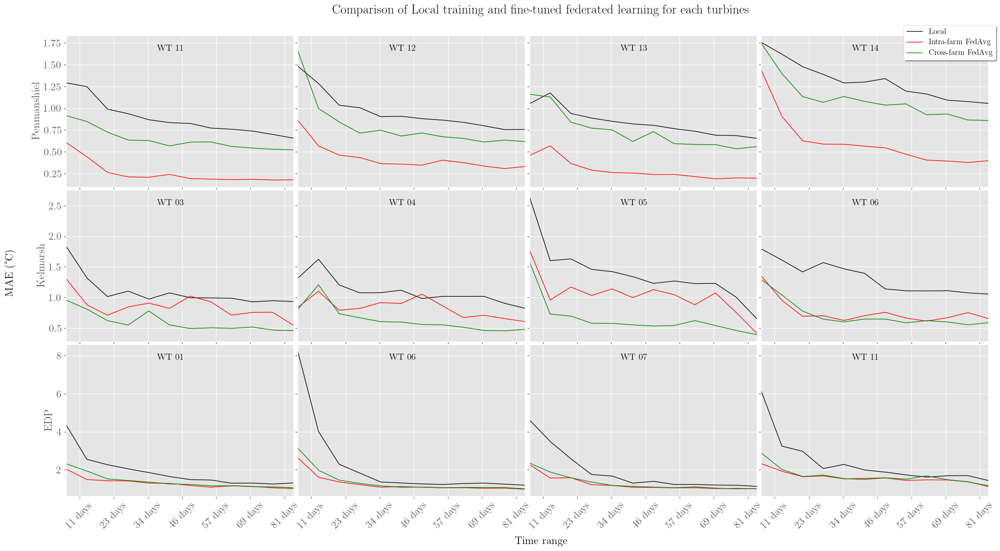

In [24]:
all_start = df["start"].unique()
fig, axs = plt.subplots(3,4, sharex= "col", sharey = "row", figsize = (4*x_size,3*y_size))
fig.subplots_adjust(top = 0.925, wspace = 0.02, hspace = 0.02, bottom= 0.1, left= 0.075)
for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    for j, client in enumerate(df[df["farm"] == farm]["client"].unique()):
        
        temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], \
                                condition= {"finetuned": [True], "algo": ["Local", "FedAvg"], "farm": farm, "client": client})
        temp_res = temp_res.unstack(1)
        temp_res = temp_res.unstack(1)
        temp_res = temp_res.dropna(axis = 1, how = "all")
        temp_res = temp_res.dropna(axis = 0, how = "all")
        temp_res = put_position(temp_res, ("res", 'Local', "NA")) 
        temp_res = smoothing(temp_res, kind = kind)
        temp_res.plot(legend = True, ax = axs[i][j], cmap = colormap)
        #axs[i][j].set_title(" ".join(client.split("_")[-2:]))
        # axs[i][j].set_title(farm + " " + "-".join(start.split("-")[:2]))
                

            
        axs[i][j].xaxis.set_tick_params(rotation=45)  
        axs[i][j].text(0.4, 0.9, " ".join(client.split("_")[-2:]), transform=axs[i][j].transAxes) 
        ticks_loc = axs[i][j].get_xticks().tolist()
        axs[i][j].xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
        ticks_label = axs[i][j].get_xticklabels()
        if len(all_start) == 4 or True: 
            l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
            axs[i][j].set_xticklabels(l)
        
        if i== 0 and j == 0:
            h,l = axs[0][0].get_legend_handles_labels()
        axs[i][j].get_legend().remove()
        axs[i][j].set_ylabel(f'{farm}')
txt = lambda col : "" if col[2] == "NA" else "Cross-farm " if col[2] else "Intra-farm "    
plt.figlegend(h, [f"{txt(col)}{col[1]}" for col in temp_res.columns.unique()], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.95))
fig.suptitle("Comparison of Local training and fine-tuned federated learning for each turbines") 
fig.supxlabel("Time range")
fig.supylabel("MAE (°C)") 

fig.savefig("../img/turbine_time_evolution.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

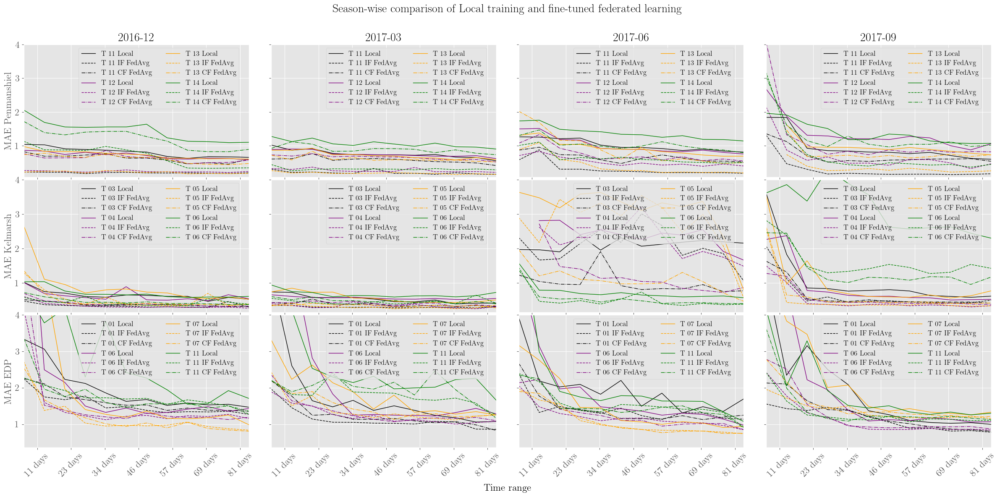

In [25]:
all_start = df["start"].unique()
fig, axs = plt.subplots(3,4, sharex= "col", sharey = "row", figsize = (1.2*4*x_size,3*y_size))
fig.subplots_adjust(top = 0.9)
for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    for j in range(4):
        client_names = df[df["farm"] == farm]["client"].unique()
        colors = colormap.colors[::len(colormap.colors)//3]
        if j < len(all_start):
            start = all_start[j]
            for k,client_name in enumerate(client_names):
                temp_res = select_group(df = df, target=["res"], group_by=["time_diff", "algo", "cross_farm"], \
                                        condition= {"finetuned": [True], "algo": ["Local", "FedAvg"], "start": all_start[j], "farm": farm, "client": client_name})
                temp_res = temp_res.unstack(1)
                temp_res = temp_res.unstack(1)
                temp_res = temp_res.dropna(axis = 1, how = "all")
                temp_res = temp_res.dropna(axis = 0, how = "all")
                temp_res = put_position(temp_res, ("res", 'Local', "NA")) 
                temp_res = smoothing(temp_res, kind = kind)
                temp_res.plot(legend = True, ax = axs[i][j], color = [colors[k]], \
                              style = style_list[0:len(temp_res.columns)])
                axs[0][j].set_title( "-".join(start.split("-")[:2]))
        # axs[i][j].set_title(farm + " " + "-".join(start.split("-")[:2]))
                

            
        axs[i][j].xaxis.set_tick_params(rotation=45)   
        ticks_loc = axs[i][j].get_xticks().tolist()
        axs[i][j].xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
        ticks_label = axs[i][j].get_xticklabels()
        if len(all_start) == 4 or True: 
            l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
            axs[i][j].set_xticklabels(l)
        
       
        axs[i][j].set_ylabel(f'MAE {farm}')
        
        axs[i][j].set_ylim(top = 4)
        
        txt = lambda col : "" if col[2] == "NA" else "CF " if col[2] else "IF "
        axs[i][j].legend(["T " +" ".join(name.split("_")[-1:]) + f" {txt(col)}{col[1]}" for name in client_names for col in temp_res.columns.unique()],\
                          loc = "upper center", bbox_to_anchor = (0.6, 1.0), ncol = 2, fancybox = True)
fig.suptitle("Season-wise comparison of Local training and fine-tuned federated learning") 
fig.supxlabel("Time range") 
pass

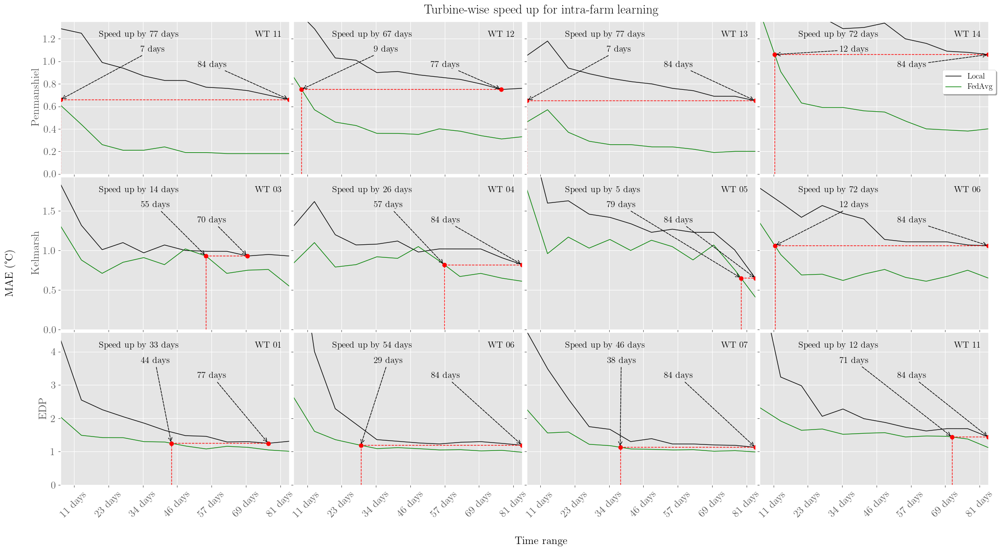

In [26]:
fig, axs = plt.subplots(3,4,  figsize=(4*x_size, 3*y_size), sharey='row', sharex = "row")
fig.subplots_adjust(top = 0.95, bottom = 0.12, left = 0.07, hspace = 0.02, wspace= 0.02)
for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    for j,client in enumerate(df[df["farm"] == farm]["client"].unique()):
              
        cold_start_display_per(df, "FedAvg", colormap, axs = axs[i][j], conditions = {"cross_farm": [False, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True, "farm": farm, 
                                                                                      "client": client},\
                        title = "", inter_position = (0.35,0.8), text_position = (0.17, 0.9), fig = fig, relative = 'axes fraction', kind = kind, tol_perc = 0,\
                            loc_pos=(0.6, 0.7), loc_relative = 'axes fraction')

        axs[i][j].set_ylabel(farm)
        axs[i][j].legend(["Local", "FedAvg"])
        axs[i][j].text(0.85, 0.9, " ".join(client.split("_")[-2:]), transform=axs[i][j].transAxes)    
        if i == 0 and j == 0:
            h,l = axs[0][0].get_legend_handles_labels()
        axs[i][j].get_legend().remove()
plt.figlegend(h,["Local", "FedAvg"], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.87))       
fig.supylabel("MAE (°C)")
fig.suptitle(f"Turbine-wise speed up for intra-farm learning")


fig.savefig("../img/individual_cold_start_speedup.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")

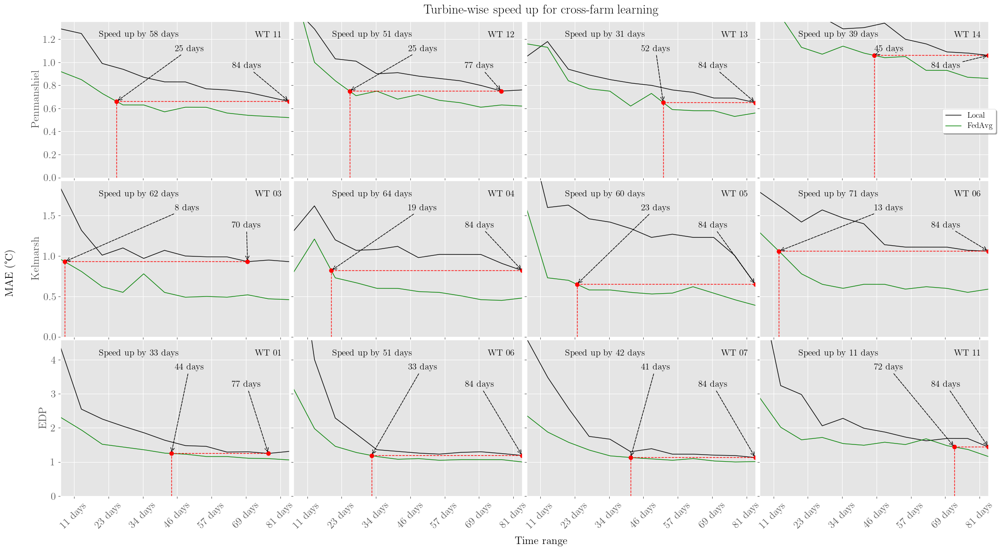

In [27]:
fig, axs = plt.subplots(3,4,  figsize=(4*x_size, 3*y_size), sharey='row', sharex = "row")
fig.subplots_adjust(top = 0.95, bottom = 0.1, left = 0.07, hspace = 0.02, wspace= 0.02)
for i, farm in enumerate(["Penmanshiel", "Kelmarsh", "EDP"]):
    for j,client in enumerate(df[df["farm"] == farm]["client"].unique()):
              
        cold_start_display_per(df, "FedAvg", colormap, axs = axs[i][j], conditions = {"cross_farm": [True, "NA"], 'algo':["Local", "FedAvg"], "finetuned": True,
                                                                                       "farm": farm, "client": client},\
                        title = "", inter_position = (0.5,0.81), text_position = (0.17, 0.9), fig = fig, relative = 'axes fraction', kind = kind, tol_perc = 0,\
                            loc_pos=(0.75, 0.7), loc_relative = 'axes fraction')
        
        axs[i][j].set_ylabel(farm)
        axs[i][j].legend(["Local", "FedAvg"])
        axs[i][j].text(0.85, 0.9, " ".join(client.split("_")[-2:]), transform=axs[i][j].transAxes)      
        if i == 0 and j == 0:
            h,l = axs[0][0].get_legend_handles_labels()
        axs[i][j].get_legend().remove()
plt.figlegend(h,["Local", "FedAvg"], fancybox=True, shadow=True, facecolor='white', bbox_to_anchor=(0.91, 0.8))       
fig.supylabel("MAE (°C)")
fig.suptitle(f"Turbine-wise speed up for cross-farm learning")


fig.savefig("../img/individual_cold_start_speedup_cross_farm.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")

# Data Quantities

In [28]:
temp_res = select_group(df = df, target=['nb_train'], group_by=["time_diff",  "client", "farm", "start"], condition= {})
temp_res = temp_res.unstack(2)
temp_res = temp_res.unstack(1)
temp_res = temp_res.dropna(axis=1, how = "all")

temp_res.index= pd.MultiIndex.from_tuples([(x[0], x[1].split(" ")[0]) for x in temp_res.index], names = ["", ""])
temp_res.columns = pd.MultiIndex.from_tuples([("Number of training data", x[1], " ".join(x[2].split("_")[-2:])) for x in temp_res.columns], names = ["", "", ""])
temp_res

Number of training data                                   \
                                       EDP                         Kelmarsh   
                                     WT 01   WT 06   WT 07   WT 11    WT 03   
                                                                              
7 days  2016-12-01                   807.0   807.0   807.0   807.0    641.0   
        2017-03-01                   807.0   807.0   807.0   807.0    493.0   
        2017-06-01                   807.0   807.0   807.0   807.0    504.0   
        2017-09-01                   807.0   714.0   807.0   807.0    449.0   
14 days 2016-12-01                  1613.0  1613.0  1613.0  1613.0    979.0   
        2017-03-01                  1613.0  1479.0  1481.0  1613.0    816.0   
        2017-06-01                  1491.0  1492.0  1613.0  1613.0    697.0   
        2017-09-01                  1613.0  1520.0  1485.0  1613.0   1256.0   
21 days 2016-12-01                  2420.0  2420.0  2420.0  2420.0   1628.0   
        2017-03-01                  2420.0  2285.0  2288.0  2420.0   1386.0   
        2017-06-01                  1963.0  1773.0  2148.0  2292.0    708.0   
        2017-09-01                  2420.0  2327.0  2292.0  2420.0   1836.0   
28 days 2016-12-01                  3226.0  3226.0  3226.0  3226.0   2328.0   
        2017-03-01                  3226.0  3092.0  3094.0  3226.0   1948.0   
        2017-06-01                  2685.0  2496.0  2870.0  3098.0    771.0   
        2017-09-01                  3226.0  3133.0  3098.0  3226.0   2188.0   
35 days 2016-12-01                  4032.0  4032.0  4032.0  4032.0   3123.0   
        2017-03-01                  4032.0  3898.0  3900.0  4032.0   2289.0   
        2017-06-01                  3203.0  3148.0  3375.0  3748.0    841.0   
        2017-09-01                  4032.0  3940.0  3904.0  4032.0   2755.0   
42 days 2016-12-01                  4839.0  4839.0  4839.0  4839.0   3425.0   
        2017-03-01                  4839.0  4585.0  4707.0  4839.0   2450.0   
        2017-06-01                  3760.0  3829.0  4056.0  4429.0    960.0   
        2017-09-01                  4839.0  4746.0  4711.0  4839.0   3314.0   
49 days 2016-12-01                  5645.0  5645.0  5645.0  5645.0   4036.0   
        2017-03-01                  5645.0  5392.0  5513.0  5645.0   3016.0   
        2017-06-01                  4432.0  4385.0  4728.0  5236.0   1293.0   
        2017-09-01                  5528.0  5425.0  5517.0  5645.0   3796.0   
56 days 2016-12-01                  6452.0  6452.0  6452.0  6452.0   4566.0   
        2017-03-01                  6331.0  6082.0  6320.0  6445.0   3448.0   
        2017-06-01                  5077.0  5080.0  5535.0  6042.0   1553.0   
        2017-09-01                  6334.0  6232.0  6324.0  6452.0   4409.0   
63 days 2016-12-01                  7258.0  7258.0  7020.0  7258.0   4904.0   
        2017-03-01                  7137.0  6888.0  7126.0  7135.0   4126.0   
        2017-06-01                  5884.0  5887.0  6341.0  6848.0   1994.0   
        2017-09-01                  7140.0  6920.0  7130.0  7258.0   4972.0   
70 days 2016-12-01                  8064.0  8064.0  7827.0  8064.0   5610.0   
        2017-03-01                  7788.0  7695.0  7932.0  7825.0   4694.0   
        2017-06-01                  6690.0  6693.0  7142.0  7655.0   2344.0   
        2017-09-01                  7947.0  7727.0  7936.0  7948.0   5512.0   
77 days 2016-12-01                  8871.0  8871.0  8633.0  8871.0   6296.0   
        2017-03-01                  8505.0  8501.0  8739.0  8632.0   5303.0   
        2017-06-01                  7496.0  7500.0  7837.0  8461.0   2446.0   
        2017-09-01                  8753.0  8386.0  8743.0  8754.0   6195.0   
84 days 2016-12-01                  9555.0  9677.0  9440.0  9677.0   6961.0   
        2017-03-01                  9195.0  9308.0  9545.0  9438.0   5521.0   
        2017-06-01                  8174.0  8306.0  8132.0  9143.0   

In [29]:
temp_res = select_group(df = df, target=['nb_train'], group_by=["time_diff", "farm"], condition= {})
temp_res = temp_res.unstack(1, fill_value= "NA")

temp_res.index = pd.Index(temp_res.index, name = "")
temp_res.columns = pd.MultiIndex.from_tuples([("Number of training data", x[1]) for x in temp_res.columns], names = ["", ""])
temp_res

Number of training data                        
                            EDP   Kelmarsh  Penmanshiel
                                                       
7 days                 801.1875   510.4000   267.666667
14 days               1567.3750   888.4375   366.750000
21 days               2295.5000  1301.3750   518.000000
28 days               3085.8750  1727.7500   696.437500
35 days               3835.7500  2173.8125   763.812500
42 days               4595.9375  2488.0625   878.937500
49 days               5354.4375  2953.2500   974.125000
56 days               6128.8750  3421.6875  1176.187500
63 days               6905.5000  3840.5625  1296.812500
70 days               7687.3125  4274.5625  1384.125000
77 days               8472.0625  4662.3125  1517.812500
84 days               9215.6875  5128.1875  1653.125000

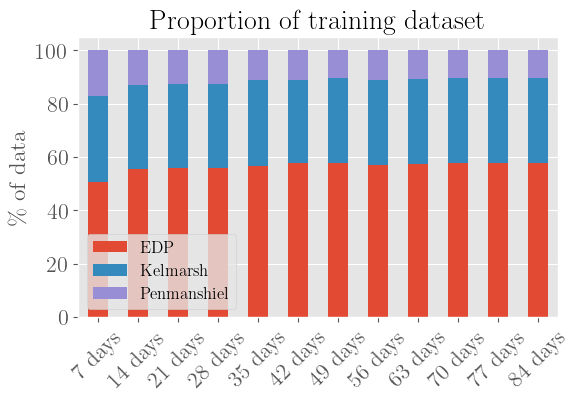

In [30]:
t = "nb_train"
fig, ax = plt.subplots(1, figsize=(x_size, y_size))
temp_res = select_group(df = df, target=[t], group_by=["time_diff", "farm"], condition= condition)
temp_res = temp_res.unstack(1, fill_value= "NA")
tot = temp_res[(t, "EDP")] + temp_res[(t, "Kelmarsh")] + temp_res[(t, "Penmanshiel")] 
for n in ["EDP", "Kelmarsh", "Penmanshiel"]:
    temp_res[(t,f"{t}_{n}_ratio")] = temp_res[(t, n)]/(tot)*100
temp_res.index = list(map(lambda x: " ".join(str(x).split(" ")[:-1]), temp_res.index))

ax = temp_res.plot.bar(y = [(t,f'{t}_{n}_ratio') for n in ["EDP", "Kelmarsh", "Penmanshiel"]], stacked=True, ax = ax)
ax.legend([f"{n}" for n in  ["EDP", "Kelmarsh", "Penmanshiel"]])
ax.set_ylabel("\% of data")
ax.set_title("Proportion of training dataset")
ax.xaxis.set_tick_params(rotation=45)
#fig.supylabel("\% of all data")
fig.savefig("../img/dataset_quantity.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
pass

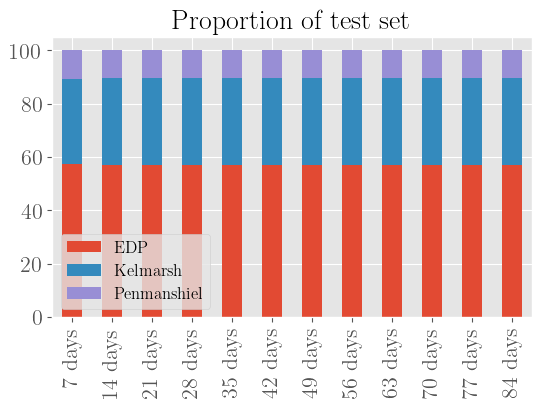

In [31]:
t = "nb_test"
temp_res = select_group(df = df, target=[t], group_by=["time_diff", "farm"], condition= condition)
temp_res = temp_res.unstack(1, fill_value= "NA")
tot = temp_res[(t, "EDP")] + temp_res[(t, "Kelmarsh")] + temp_res[(t, "Penmanshiel")] 
for n in ["EDP", "Kelmarsh", "Penmanshiel"]:
    temp_res[(t,f"{t}_{n}_ratio")] = temp_res[(t, n)]/(tot)*100
temp_res.index = list(map(lambda x: " ".join(str(x).split(" ")[:-1]), temp_res.index))
ax = temp_res.plot.bar(y = [(t,f'{t}_{n}_ratio') for n in ["EDP", "Kelmarsh", "Penmanshiel"]], stacked=True)
ax.legend([f"{n}" for n in  ["EDP", "Kelmarsh", "Penmanshiel"]])
ax.set_title("Proportion of test set")
pass

# Communication overhead

In [32]:
temp_res = select_group(df = df, target=["data_train_weight",  "data_test_weight", "model_size", "num_round"], group_by=["time_diff", "algo", "cross_farm"], \
                        condition= {"finetuned" : False})

temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(1)
temp_res = temp_res.dropna(axis = 1, how = "all").fillna(value = "NA")
for c in [col for col in temp_res.columns if col[0] == "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x*12, 2) if x != "NA" else np.nan)
for c in [col for col in temp_res.columns if col[0] != "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x, 2) if x != "NA" else np.nan)

for c in [col for col in temp_res.columns if col[0] == "model_size"]:
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))] =  temp_res[c].mul(temp_res[("num_round", c[1], c[2])])*2*12
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))]= temp_res[("Federated communication", c[1], bool_to_txt(c[2]))].apply(lambda x : round(x,2))

temp_res["Centralized communication"] = temp_res[[col for col in temp_res.columns if col[0] == "data_train_weight"][0]]
temp_res = temp_res[[col for col in temp_res.columns if col == ("Centralized communication", "", "") or col[0] == "Federated communication"]]
temp_res.index = pd.Index(temp_res.index, name = "")

temp_res.columns = pd.Index([x[0] + " " + x[1] + " " + x[2] if x[0] == "Federated communication"else "Centralized communication"\
                                               for x in temp_res.columns ], name = "")
temp_res

,Federated communication FedAvg Intra-farm,Federated communication FedAvg Cross-farm,Centralized communication
,,,
7 days,792.00,643.47,14.85
14 days,695.85,344.52,26.24
21 days,662.43,244.20,38.25
28 days,593.79,463.98,51.22
35 days,550.65,475.86,62.97
42 days,440.43,322.08,74.02
49 days,480.93,244.20,86.28
56 days,413.82,346.50,99.72
63 days,384.12,275.88,111.95


In [ ]:
filename = f"result data Exp_2"
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = "Exp_2"
df2 = pd.read_pickle(os.path.join(Path.EXP_PATH, filename + ".pkl"))

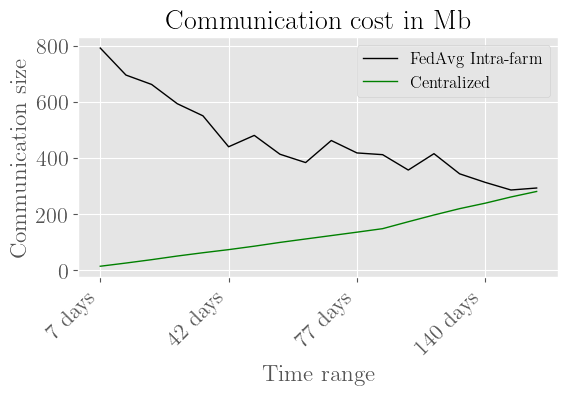

In [34]:
fig, ax = plt.subplots()

temp_res = select_group(df = df2, target=["data_train_weight",  "data_test_weight", "model_size", "num_round"], group_by=["time_diff", "algo", "cross_farm"], \
                        condition= {"finetuned" : False, "cross_farm": [False, "NA"]})

temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(1)
temp_res = temp_res.dropna(axis = 1, how = "all").fillna(value = "NA")
for c in [col for col in temp_res.columns if col[0] == "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x*12, 2) if x != "NA" else np.nan)
for c in [col for col in temp_res.columns if col[0] != "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x, 2) if x != "NA" else np.nan)

for c in [col for col in temp_res.columns if col[0] == "model_size"]:
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))] =  temp_res[c].mul(temp_res[("num_round", c[1], c[2])])*2*12
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))]= temp_res[("Federated communication", c[1], bool_to_txt(c[2]))].apply(lambda x : round(x,2))

temp_res["Centralized communication"] = temp_res[[col for col in temp_res.columns if col[0] == "data_train_weight"][0]]
temp_res = temp_res[[col for col in temp_res.columns if col == ("Centralized communication", "", "") or col[0] == "Federated communication"]]
temp_res.index = pd.Index(temp_res.index, name = "")

temp_res.columns = pd.Index([x[1] + " " + x[2] if x[0] == "Federated communication"else "Centralized"\
                                               for x in temp_res.columns ], name = "")
#temp_res = smoothing(temp_res, kind = kind)
temp_res.plot(legend = True, ax = ax, cmap = colormap)

ax.set_title("Communication cost in Mb")
ax.xaxis.set_tick_params(rotation=45)   
ticks_loc = ax.get_xticks().tolist()
ax.xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
ticks_label = ax.get_xticklabels()
l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
ax.set_xticklabels(l)
ax.set_xlabel('Time range')
ax.set_ylabel("Communication size")

fig.savefig("../img/communication_cost.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")

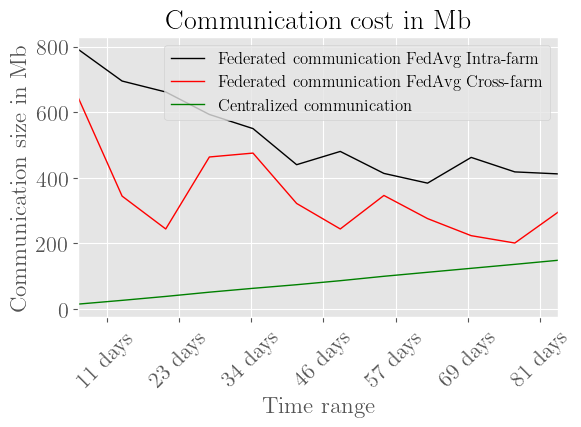

In [35]:
ax = plt.subplot()

temp_res = select_group(df = df, target=["data_train_weight",  "data_test_weight", "model_size", "num_round"], group_by=["time_diff", "algo", "cross_farm"], \
                        condition= {"finetuned" : False})

temp_res = temp_res.unstack(1)
temp_res = temp_res.unstack(1)
temp_res = temp_res.dropna(axis = 1, how = "all").fillna(value = "NA")
for c in [col for col in temp_res.columns if col[0] == "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x*12, 2) if x != "NA" else np.nan)
for c in [col for col in temp_res.columns if col[0] != "data_train_weight"]:
    temp_res[c] = temp_res[c].apply(lambda x: round(x, 2) if x != "NA" else np.nan)

for c in [col for col in temp_res.columns if col[0] == "model_size"]:
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))] =  temp_res[c].mul(temp_res[("num_round", c[1], c[2])])*2*12
    temp_res[("Federated communication", c[1], bool_to_txt(c[2]))]= temp_res[("Federated communication", c[1], bool_to_txt(c[2]))].apply(lambda x : round(x,2))

temp_res["Centralized communication"] = temp_res[[col for col in temp_res.columns if col[0] == "data_train_weight"][0]]
temp_res = temp_res[[col for col in temp_res.columns if col == ("Centralized communication", "", "") or col[0] == "Federated communication"]]
temp_res.index = pd.Index(temp_res.index, name = "")

temp_res.columns = pd.Index([x[0] + " " + x[1] + " " + x[2] if x[0] == "Federated communication"else "Centralized communication"\
                                               for x in temp_res.columns ], name = "")
#temp_res = smoothing(temp_res, kind = kind)
temp_res.plot(legend = True, ax = ax, cmap = colormap)

ax.set_title("Communication cost in Mb")
ax.xaxis.set_tick_params(rotation=45)   
ticks_loc = ax.get_xticks().tolist()
ax.xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
ticks_label = ax.get_xticklabels()
l = [" ".join(x.get_text().split(" ")[:-1]) for x in ticks_label]
ax.set_xticklabels(l)
ax.set_xlabel('Time range')
ax.set_ylabel("Communication size in Mb")
pass

# Visual evaluation of the prediction

In [36]:
from model_parameter import *

experiment_name = "Exp_1"
file_name = f"result data {experiment_name}"
gpu = False

with open(os.path.join(f"results/{experiment_name}", f"{exp.name}_exp_parameters.pkl"), 'rb') as f:
    exp = pickle.load(f)
with open(os.path.join(f"results/{experiment_name}", f"{exp.name}_model_parameters.pkl"), 'rb') as f:
    model = pickle.load(f)



Preparing clients from 2016-12-01 18:30:00 to 2016-12-22 18:30:00

Created client Penmanshiel turbine WT_11 with 1062
Created client Penmanshiel turbine WT_12 with 916
Created client Penmanshiel turbine WT_13 with 1052
Created client Penmanshiel turbine WT_14 with 745
__________________________________________________________
Created client Kelmarsh turbine WT_03 with 2035
Created client Kelmarsh turbine WT_04 with 2270
Created client Kelmarsh turbine WT_05 with 2422
Created client Kelmarsh turbine WT_06 with 2287
__________________________________________________________
Created client EDP turbine WT_01 with 3025
Created client EDP turbine WT_06 with 3025
Created client EDP turbine WT_07 with 3025
Created client EDP turbine WT_11 with 3025
__________________________________________________________
Creating plot 1/2


Preparing clients from 2017-06-01 18:30:00 to 2017-06-22 18:30:00

Created client Penmanshiel turbine WT_11 with 313
Created client Penmanshiel turbine WT_12 with 593
C

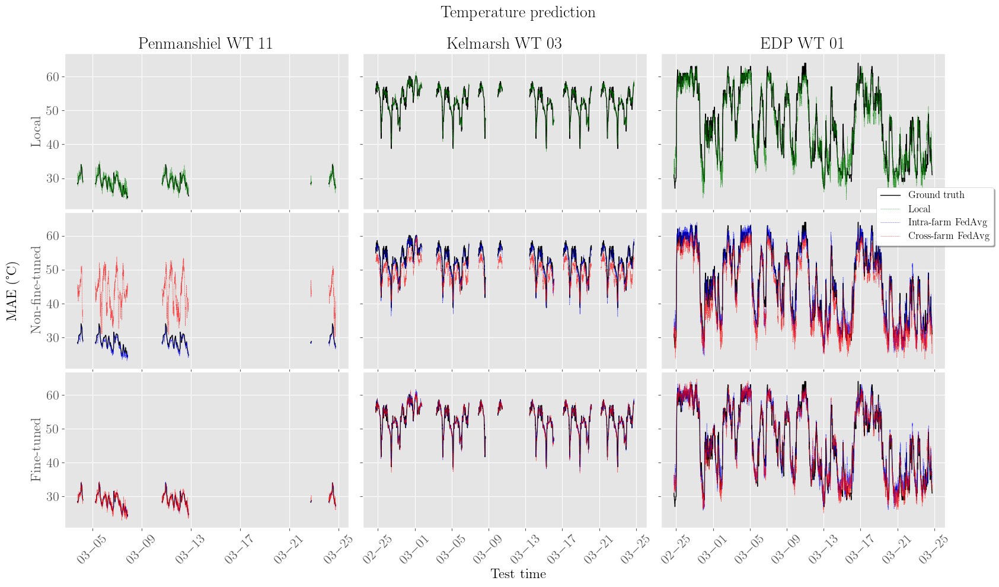

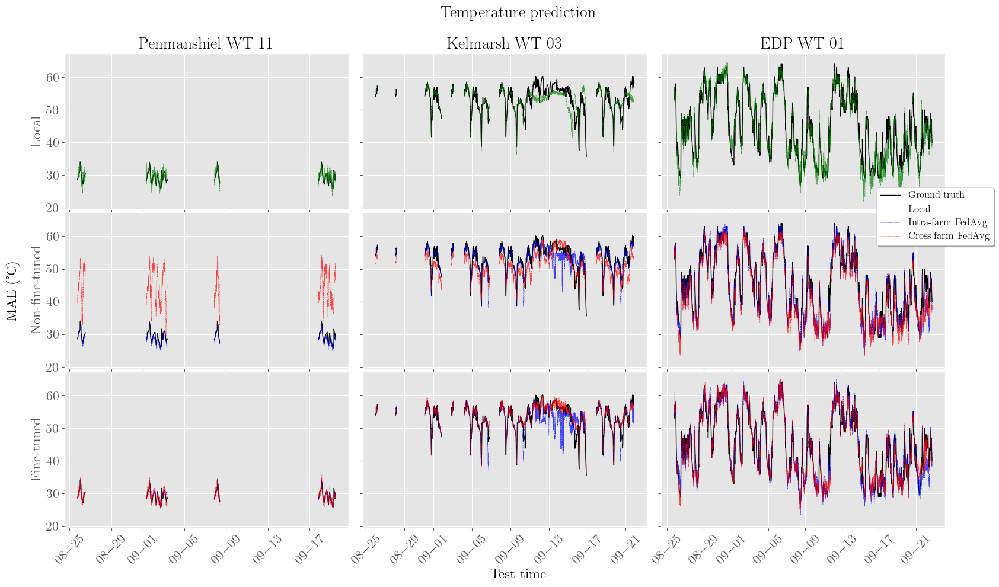

In [37]:
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name

window = "all"
start = 0
stride = 1

time_ranges = exp.all_dates_range[2:15:12]
prev_time_range = (None, None)
# Make one plot per time range on testing dataset
for k, time_range in enumerate([t for t in time_ranges if t in Path.get_time_range_list()]):
    if prev_time_range[0] != time_range[0]:
        print("\n")
        clients, _, _, _ = make_clients(exp = exp, time_range = time_range)
    clients = [[c for c in clients if farm in c.name][0] for farm in exp.list_farm_names]
    prev_time_range = time_range
    print(f"Creating plot {k+1}/{len([t for t in time_ranges if t in Path.get_time_range_list()])}")
    fig, axs = display_output(time_range, exp, model, Path, clients, window = window, start = start, stride =stride, farm = None,\
                   adjust_dict = {"top" : 0.9, "bottom" : 0.1, "wspace": 0.05, "left":0.075}, local_line = 1., line = 0.4, local_alpha = 1, alpha = 0.7)
    axs[0][0].set_ylabel("Local")
    axs[1][0].set_ylabel("Non-fine-tuned")
    axs[2][0].set_ylabel("Fine-tuned")
    
    
    hl, _ = axs[0][0].get_legend_handles_labels()
    hf, _ = axs[1][0].get_legend_handles_labels()
    h = hl + hf[1:]
    plt.figlegend(h, ["Ground truth", "Local", "Intra-farm FedAvg", "Cross-farm FedAvg"], fancybox=True, shadow=True, facecolor='white', loc = "right", bbox_to_anchor=(0.95, 0.625))
    myFmt = mdates.DateFormatter('%m-%d')
    for i in range(3):
        for j in range(3):
            axs[i][j].xaxis.set_major_formatter(myFmt)
            axs[i][j].get_legend().remove()

    fig.suptitle("Temperature prediction")
    fig.supylabel("MAE (°C)")
    if k == 0:
        fig.savefig("../img/output_plot_december_3w.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
    elif k == 1 :
        fig.savefig("../img/output_plot_june_3w.png", dpi = "figure", bbox_inches = "tight", transparent = False, facecolor = "white")
    
pass



Preparing clients from 2016-12-01 18:30:00 to 2016-12-22 18:30:00

Created client Penmanshiel turbine WT_11 with 1062
Created client Penmanshiel turbine WT_12 with 916
Created client Penmanshiel turbine WT_13 with 1052
Created client Penmanshiel turbine WT_14 with 745
__________________________________________________________
Created client Kelmarsh turbine WT_03 with 2035
Created client Kelmarsh turbine WT_04 with 2270
Created client Kelmarsh turbine WT_05 with 2422
Created client Kelmarsh turbine WT_06 with 2287
__________________________________________________________
Created client EDP turbine WT_01 with 3025
Created client EDP turbine WT_06 with 3025
Created client EDP turbine WT_07 with 3025
Created client EDP turbine WT_11 with 3025
__________________________________________________________
Creating plot 1/2


Preparing clients from 2017-06-01 18:30:00 to 2017-06-22 18:30:00

Created client Penmanshiel turbine WT_11 with 313
Created client Penmanshiel turbine WT_12 with 593
C

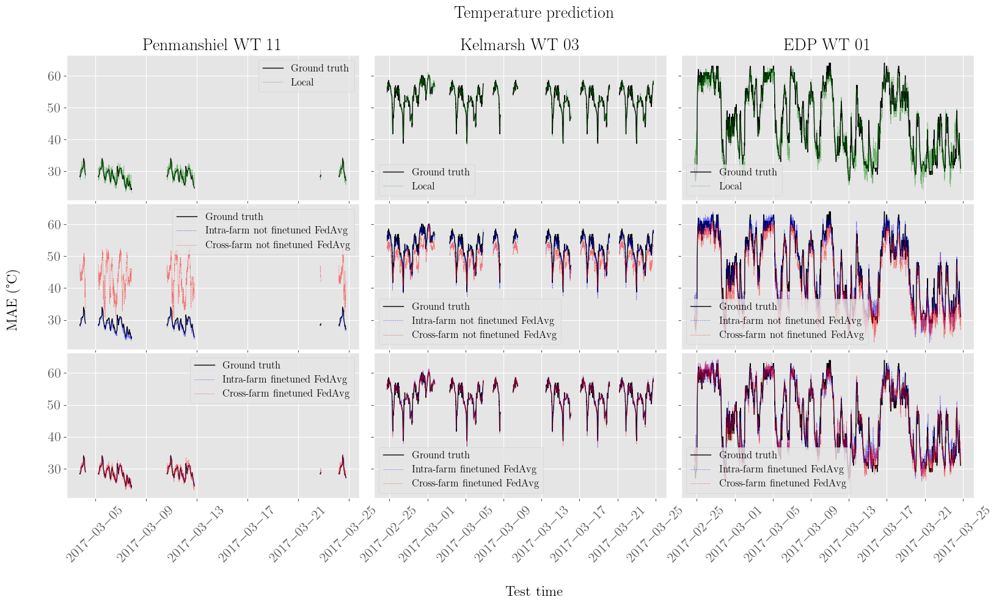

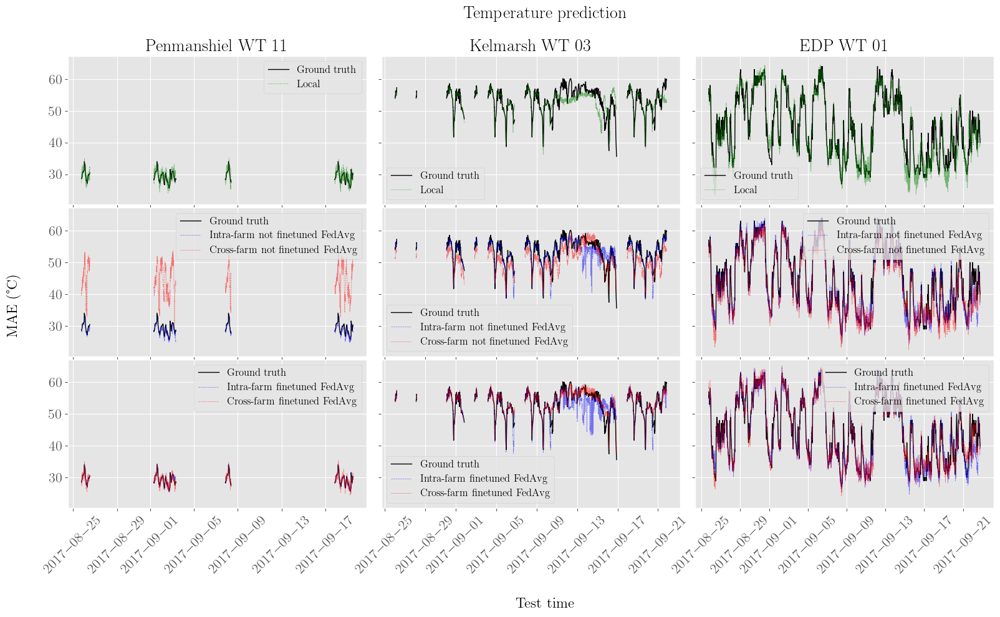

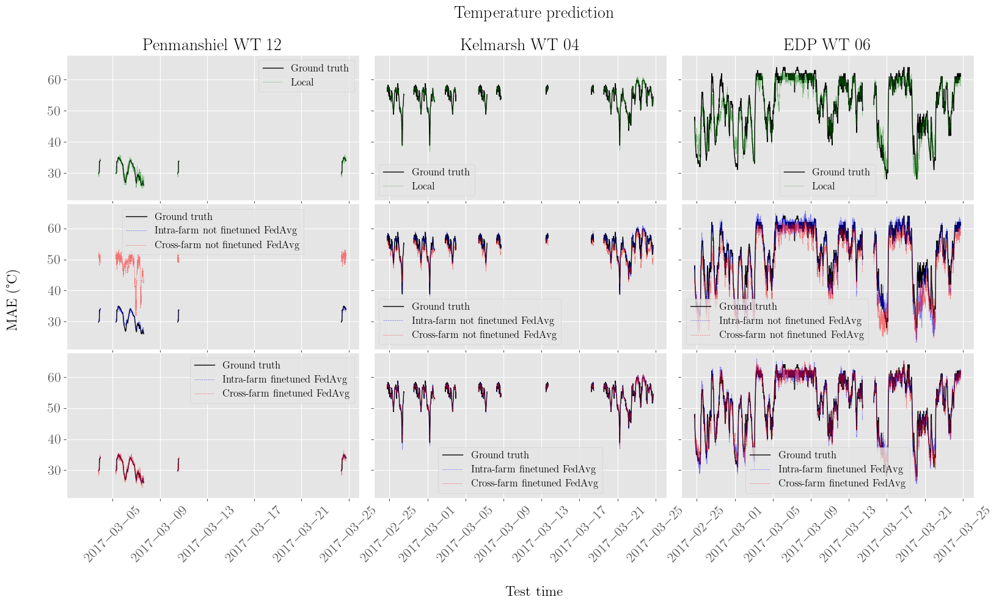

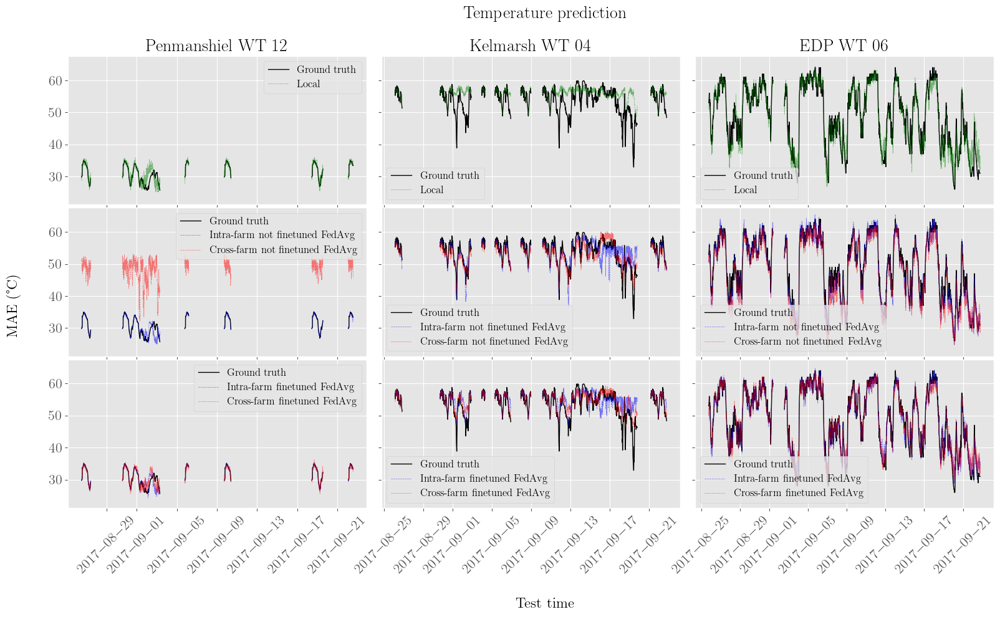

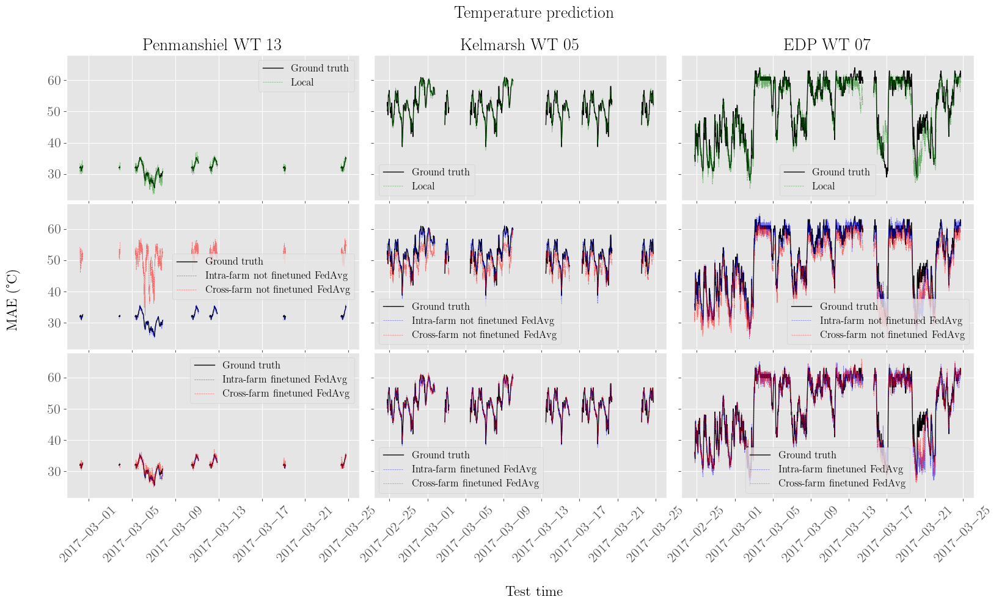

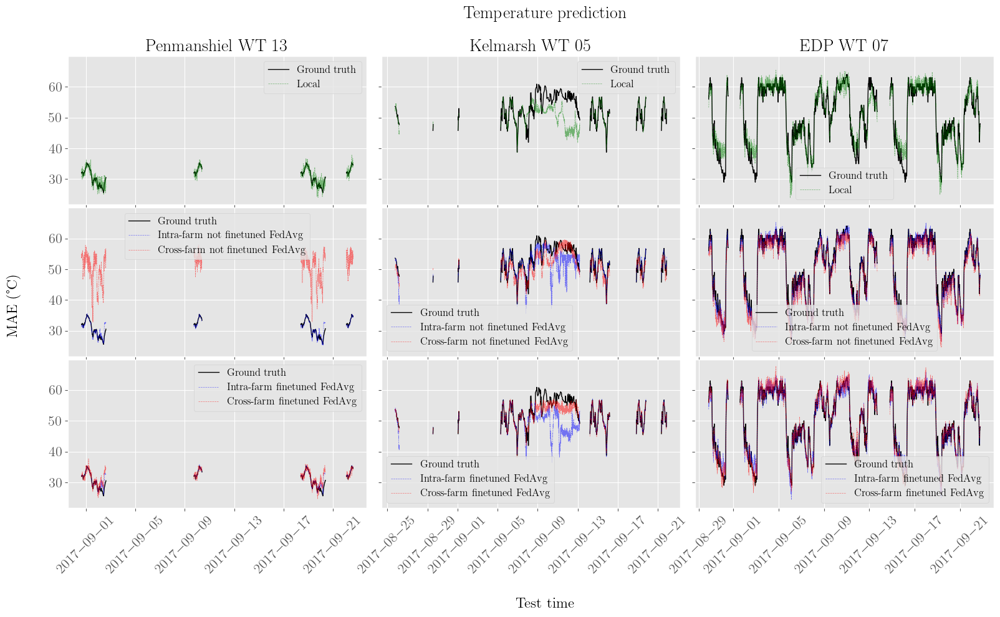

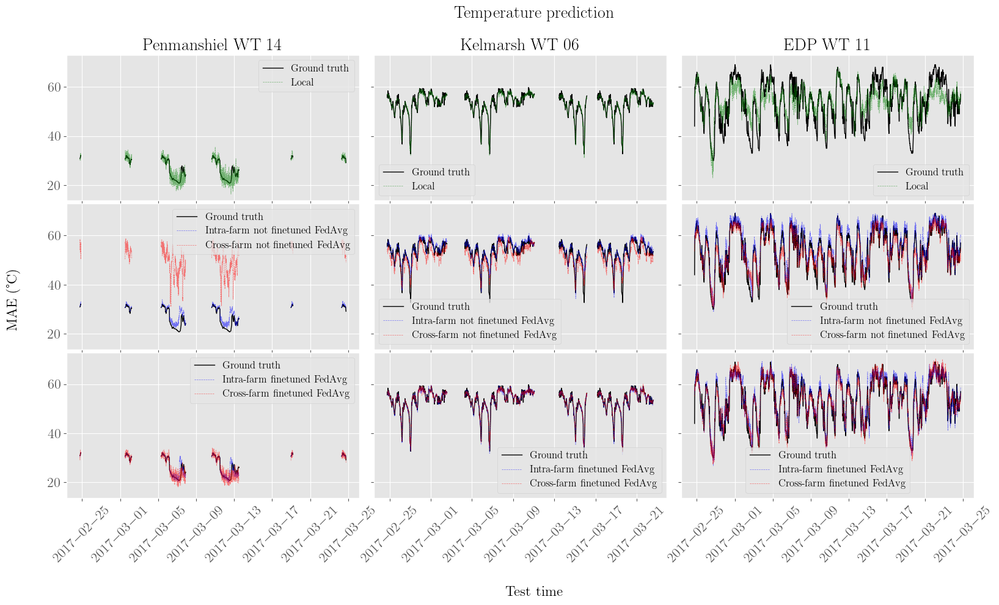

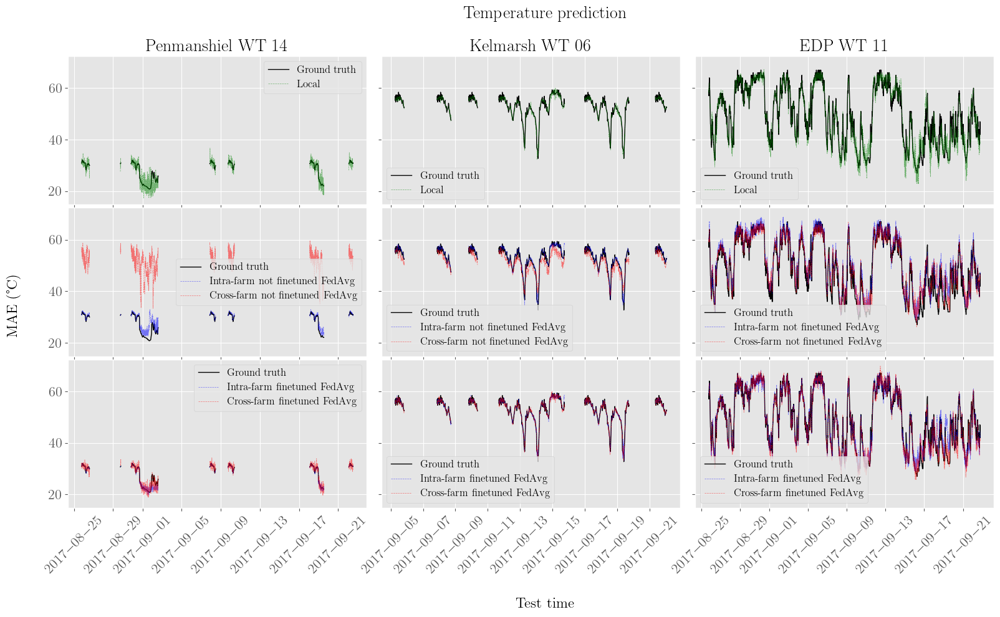

In [38]:
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name

window = "all"
start = 0
stride = 1

time_ranges = exp.all_dates_range[2:15:12]
prev_time_range = (None, None)
# Make one plot per time range on testing dataset
for l in range(4):
    for k, time_range in enumerate([t for t in time_ranges if t in Path.get_time_range_list()]):
        if prev_time_range[0] != time_range[0]:
            print("\n")
            clients, _, _, _ = make_clients(exp = exp, time_range = time_range)
        clients = [[c for c in clients if farm in c.name][l] for farm in exp.list_farm_names]
        prev_time_range = time_range
        print(f"Creating plot {k+1}/{len([t for t in time_ranges if t in Path.get_time_range_list()])}")
        fig, axs = display_output(time_range, exp, model, Path, clients, window = window, start = start, stride =stride, farm = None,\
                    adjust_dict = {"top" : 0.9, "bottom" : 0.175, "wspace": 0.05, "left":0.075})
        fig.suptitle("Temperature prediction")
        fig.supylabel("MAE (°C)")
   



Preparing clients from 2016-12-01 18:30:00 to 2016-12-22 18:30:00

Created client Penmanshiel turbine WT_11 with 1062
Created client Penmanshiel turbine WT_12 with 916
Created client Penmanshiel turbine WT_13 with 1052
Created client Penmanshiel turbine WT_14 with 745
__________________________________________________________
Created client Kelmarsh turbine WT_03 with 2035
Created client Kelmarsh turbine WT_04 with 2270
Created client Kelmarsh turbine WT_05 with 2422
Created client Kelmarsh turbine WT_06 with 2287
__________________________________________________________
Created client EDP turbine WT_01 with 3025
Created client EDP turbine WT_06 with 3025
Created client EDP turbine WT_07 with 3025
Created client EDP turbine WT_11 with 3025
__________________________________________________________
Creating plot 1/2


Preparing clients from 2017-06-01 18:30:00 to 2017-06-22 18:30:00

Created client Penmanshiel turbine WT_11 with 313
Created client Penmanshiel turbine WT_12 with 593
C

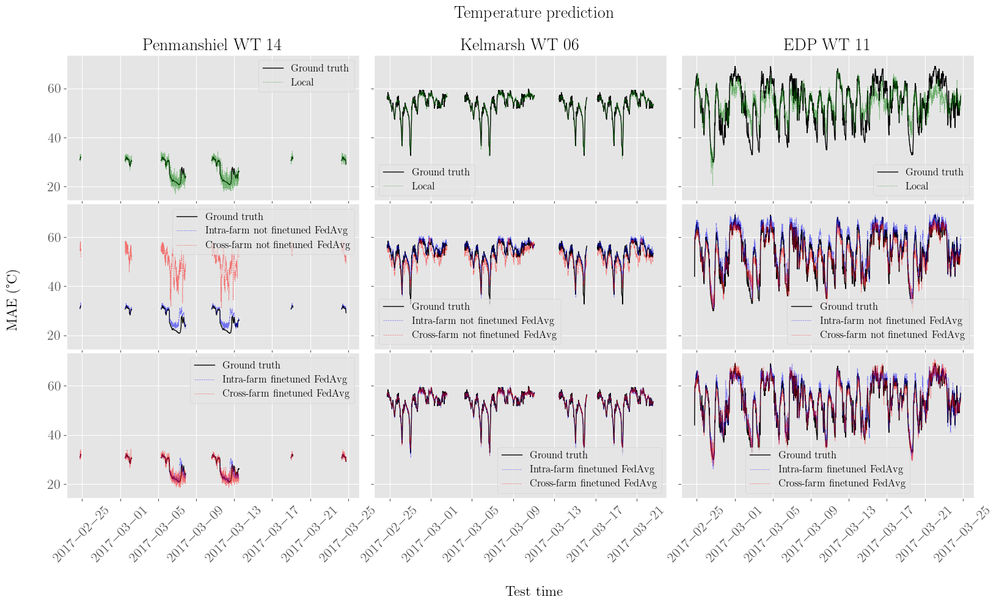

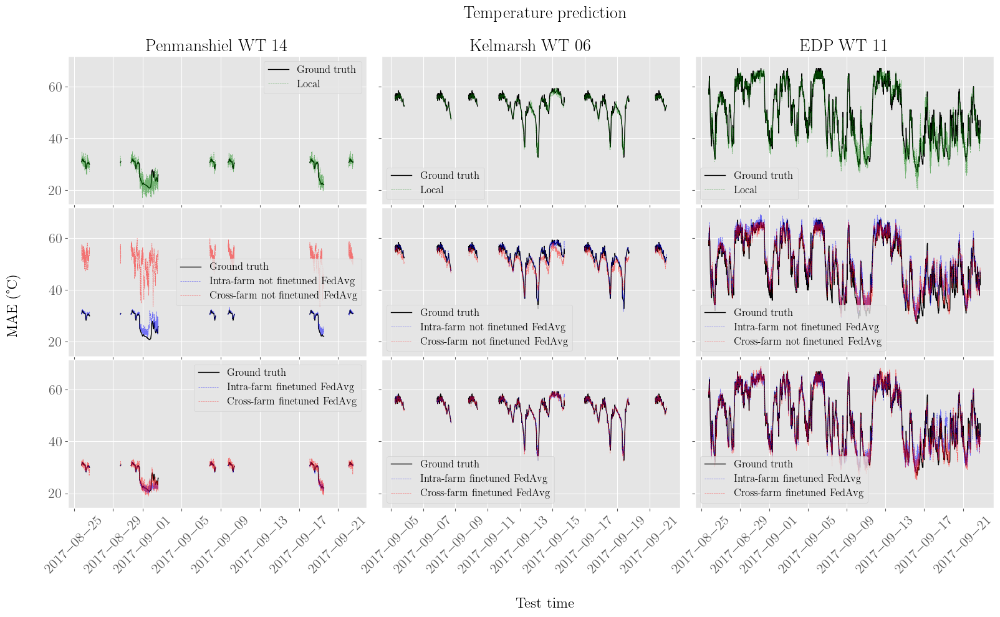

In [39]:
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name

window = "all"
start = 0
stride = 1

time_ranges = exp.all_dates_range[2:15:12]
prev_time_range = (None, None)
# Make one plot per time range on testing dataset
for k, time_range in enumerate([t for t in time_ranges if t in Path.get_time_range_list()]):
    if prev_time_range[0] != time_range[0]:
        print("\n")
        clients, _, _, _ = make_clients(exp = exp, time_range = time_range)
    clients = [[c for c in clients if farm in c.name][-1] for farm in exp.list_farm_names]
    prev_time_range = time_range
    print(f"Creating plot {k+1}/{len([t for t in time_ranges if t in Path.get_time_range_list()])}")
    fig, axs = display_output(time_range, exp, model, Path, clients, window = window, start = start, stride =stride, farm = None,\
                   adjust_dict = {"top" : 0.9, "bottom" : 0.175, "wspace": 0.05, "left":0.075})
    fig.suptitle("Temperature prediction")
    fig.supylabel("MAE (°C)")
   
pass  



Preparing clients from 2016-12-01 18:30:00 to 2016-12-08 18:30:00

Created client Penmanshiel turbine WT_11 with 505
Created client Penmanshiel turbine WT_12 with 432
Created client Penmanshiel turbine WT_13 with 447
Created client Penmanshiel turbine WT_14 with 256
__________________________________________________________
Created client Kelmarsh turbine WT_03 with 802
Created client Kelmarsh turbine WT_04 with 862
Created client Kelmarsh turbine WT_05 with 1009
Created client Kelmarsh turbine WT_06 with 1009
__________________________________________________________
Created client EDP turbine WT_01 with 1009
Created client EDP turbine WT_06 with 1009
Created client EDP turbine WT_07 with 1009
Created client EDP turbine WT_11 with 1009
__________________________________________________________
Creating plot 1/12
Creating plot 2/12
Creating plot 3/12


Preparing clients from 2017-06-01 18:30:00 to 2017-06-08 18:30:00

Created client Penmanshiel turbine WT_11 with 252
Created client P

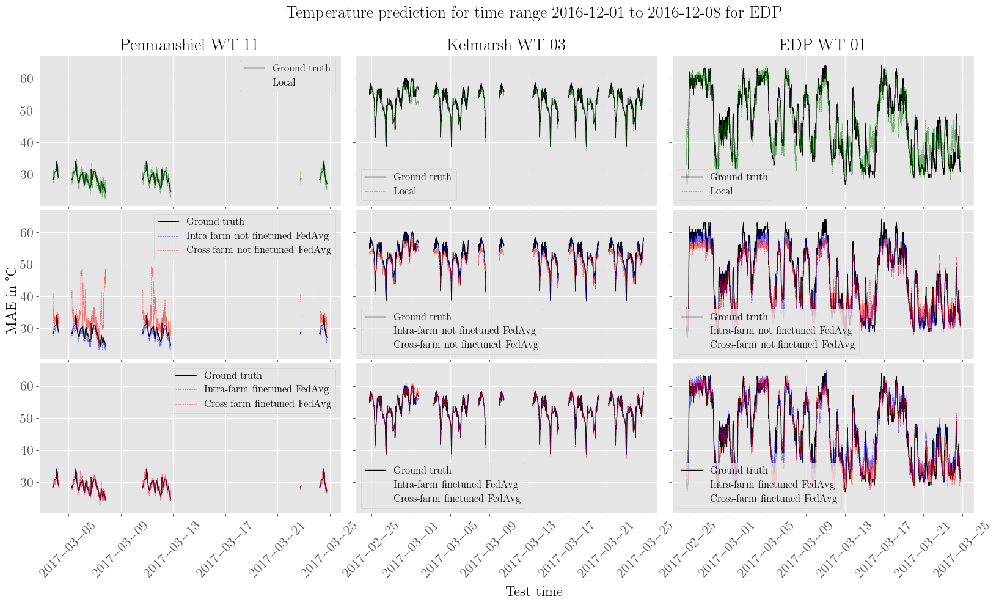

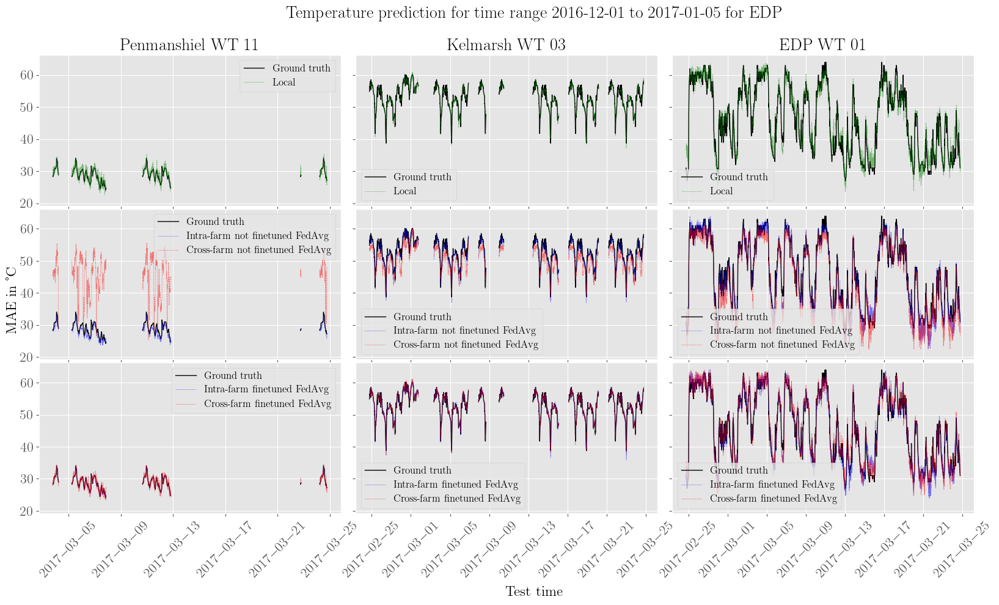

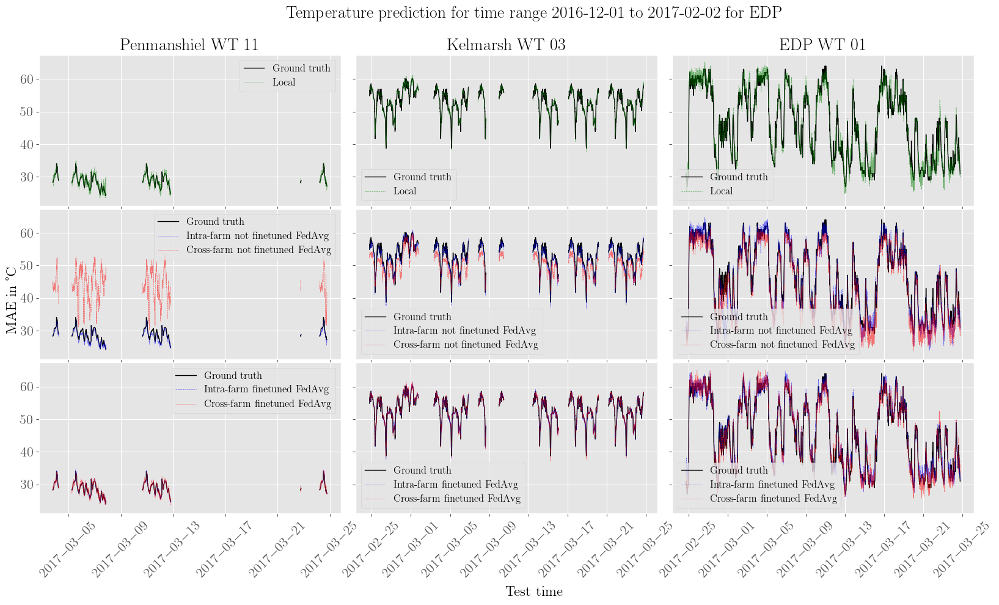

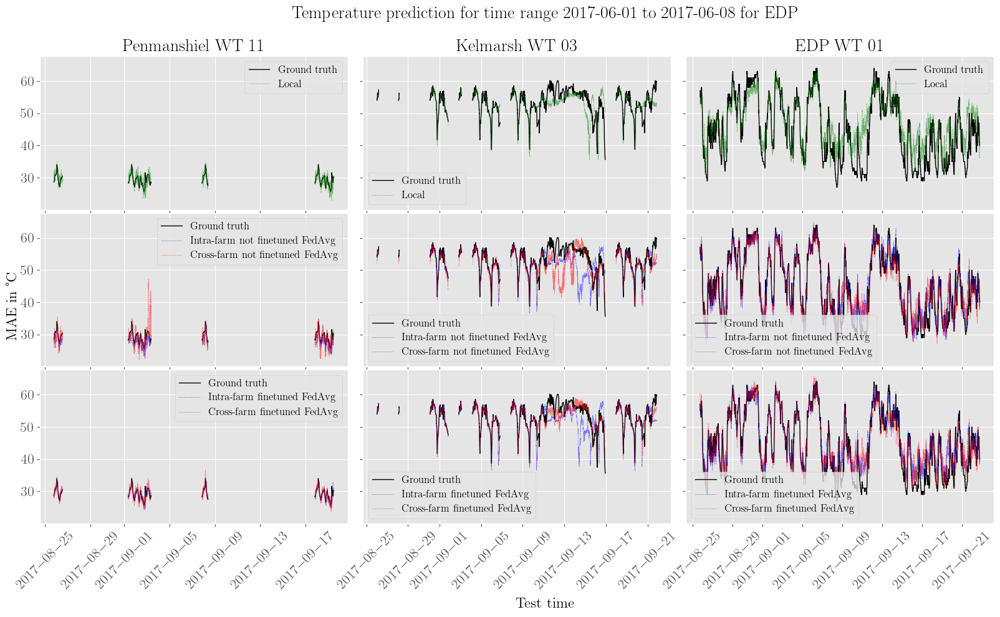

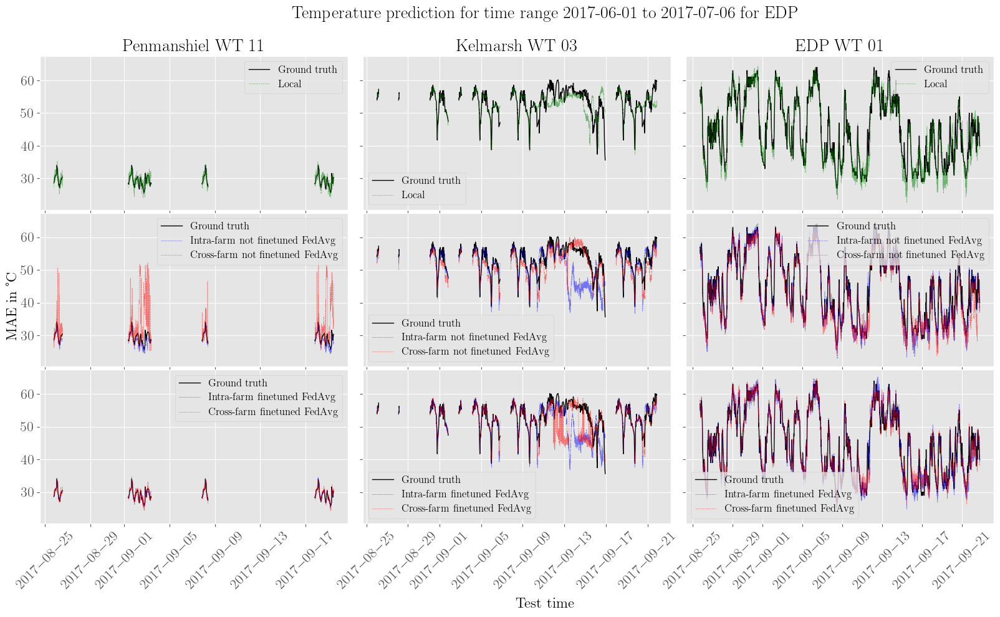

...

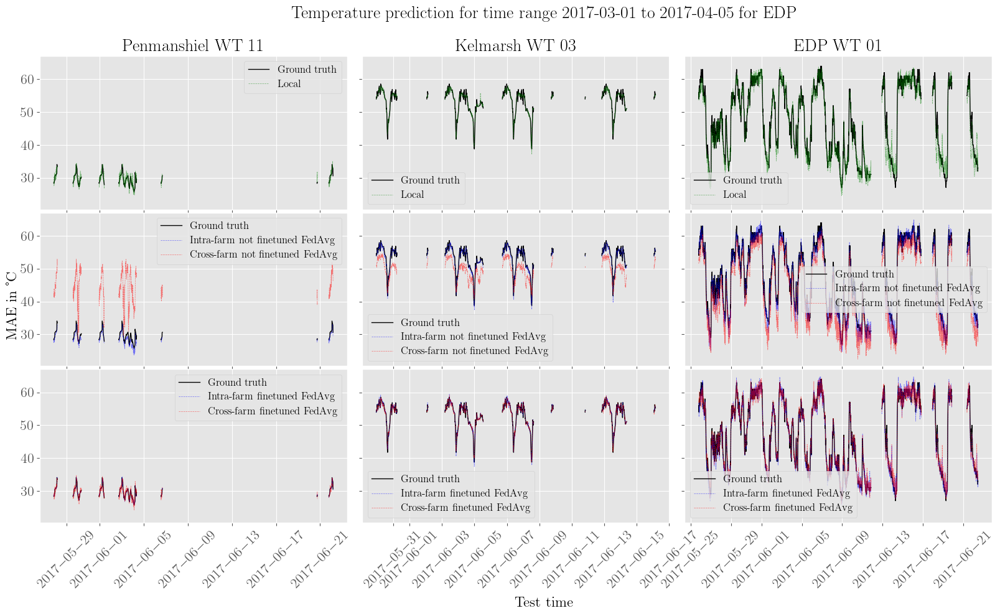

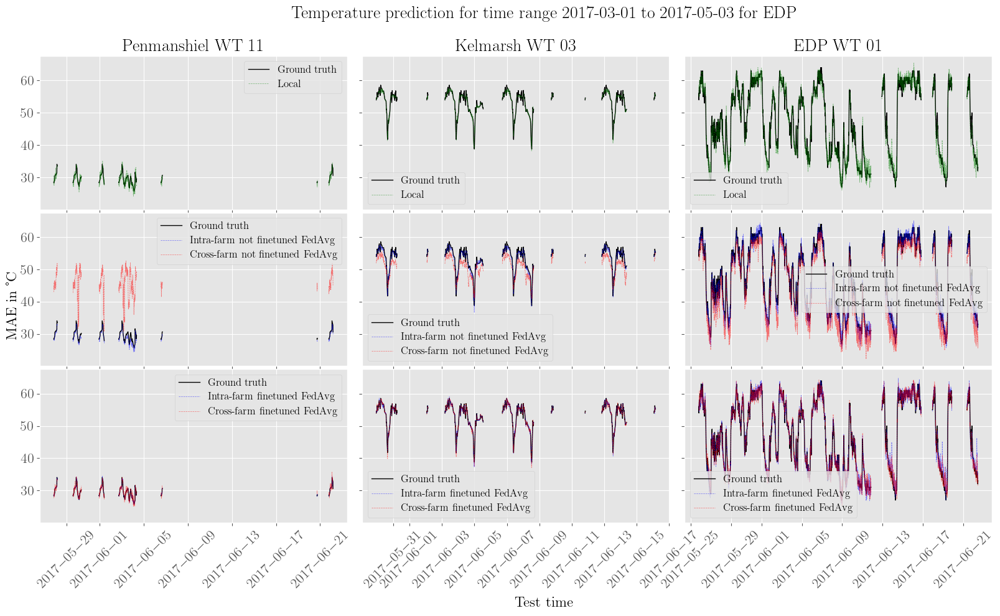

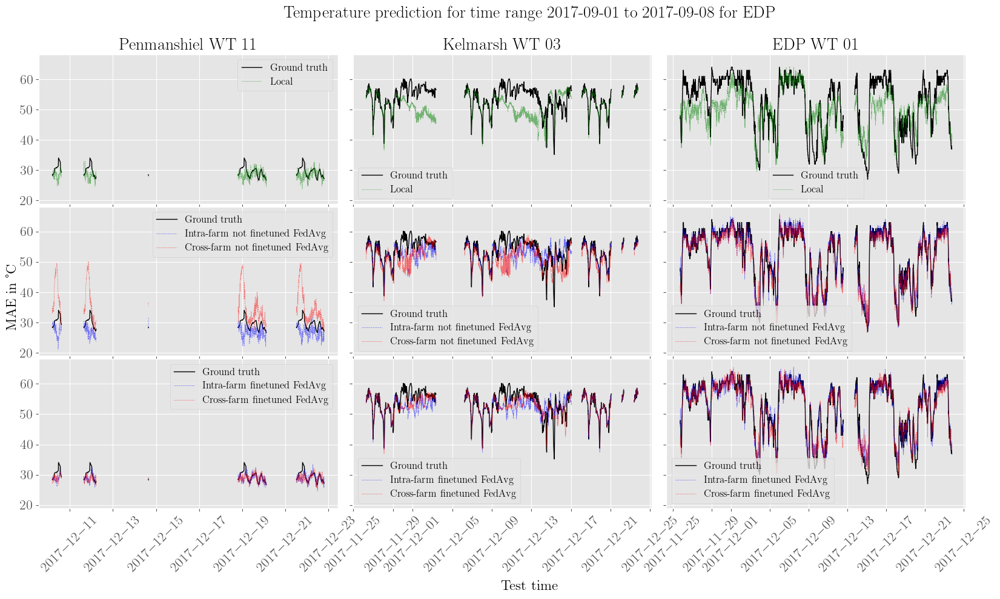

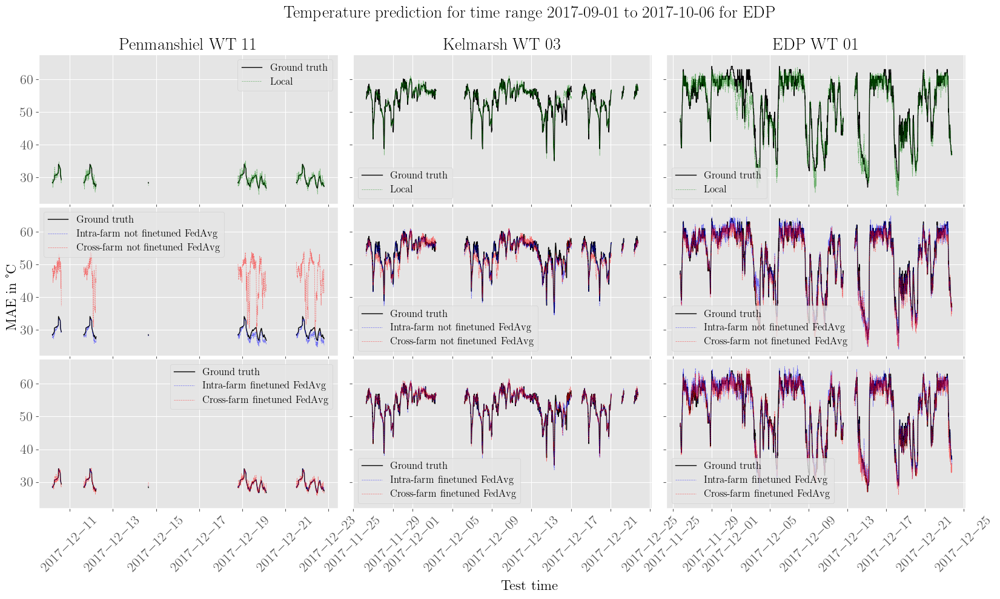

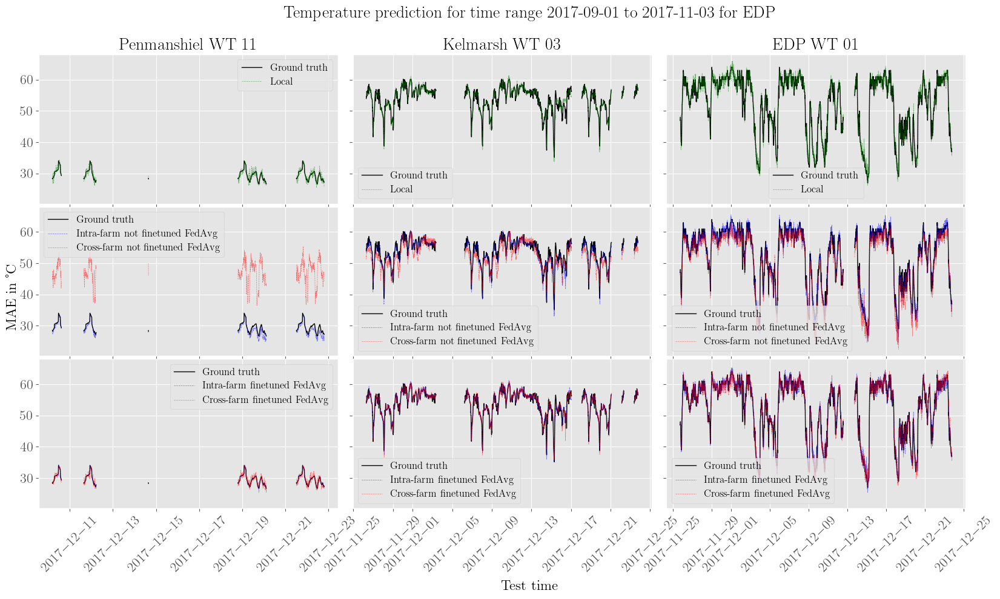

In [40]:
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name

window = "all"
start = 0
stride = 1

time_ranges = exp.all_dates_range[0::4]
prev_time_range = (None, None)
# Make one plot per time range on testing dataset
for k, time_range in enumerate([t for t in time_ranges if t in Path.get_time_range_list()]):
    if prev_time_range[0] != time_range[0]:
        print("\n")
        clients, _, _, _ = make_clients(exp = exp, time_range = time_range)

    prev_time_range = time_range
    print(f"Creating plot {k+1}/{len([t for t in time_ranges if t in Path.get_time_range_list()])}")
    fig, axs = display_output(time_range, exp, model, Path, clients, window = window, start = start, stride =stride, farm = None,\
                   adjust_dict = {"top" : 0.9, "bottom" : 0.15, "wspace": 0.05, "left":0.05})
   
pass  



Preparing clients from 2016-12-01 18:30:00 to 2016-12-15 18:30:00

Created client Penmanshiel turbine WT_11 with 769
Created client Penmanshiel turbine WT_12 with 692
Created client Penmanshiel turbine WT_13 with 712
Created client Penmanshiel turbine WT_14 with 437
__________________________________________________________
Created client Kelmarsh turbine WT_03 with 1224
Created client Kelmarsh turbine WT_04 with 1411
Created client Kelmarsh turbine WT_05 with 1635
Created client Kelmarsh turbine WT_06 with 1476
__________________________________________________________
Created client EDP turbine WT_01 with 2017
Created client EDP turbine WT_06 with 2017
Created client EDP turbine WT_07 with 2017
Created client EDP turbine WT_11 with 2017
__________________________________________________________
Creating plot 1/1


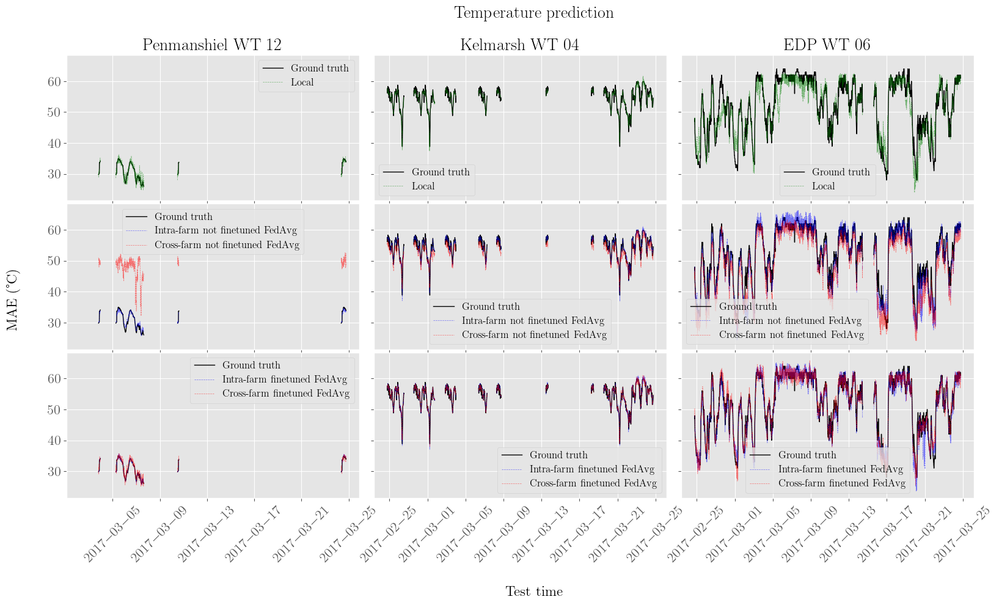

In [41]:
Path = PATHClass(BASE_PATH=BASE_PATH)
Path.exp_name = experiment_name

window = "all"
start = 0
stride = 1

time_ranges = [exp.all_dates_range[1]]
prev_time_range = (None, None)
# Make one plot per time range on testing dataset
for k, time_range in enumerate([t for t in time_ranges if t in Path.get_time_range_list()]):
    if prev_time_range[0] != time_range[0]:
        print("\n")
        clients, _, _, _ = make_clients(exp = exp, time_range = time_range)
    clients = [[c for c in clients if farm in c.name][1] for farm in exp.list_farm_names]
    prev_time_range = time_range
    print(f"Creating plot {k+1}/{len([t for t in time_ranges if t in Path.get_time_range_list()])}")
    fig, axs = display_output(time_range, exp, model, Path, clients, window = window, start = start, stride =stride, farm = None,\
                   adjust_dict = {"top" : 0.9, "bottom" : 0.175, "wspace": 0.05, "left":0.075})
    fig.suptitle("Temperature prediction")
    fig.supylabel("MAE (°C)")
   